# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

C:\Users\lenovo\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3""", con) 

# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return 'negative'
    return 'positive'

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
print("Data Points in Each class :")
print(filtered_data['Score'].value_counts()) 
filtered_data.head(3)

Number of data points in our data (525814, 10)
Data Points in Each class :
positive    443777
negative     82037
Name: Score, dtype: int64


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,positive,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,negative,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,positive,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [3]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [4]:
#Sorting the data taking productid as the parameter
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
sorted_data.shape

(525814, 10)

In [5]:
#Deleting the dublicates reviews which is created when user writed a review for the product, it automatically generates for the same product of different color etc
final = sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [6]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [8]:
#Dropping the data which has HelpfulnessNumerator<HelpfulnessDenominator which is impossible
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


positive    307061
negative     57110
Name: Score, dtype: int64

In [9]:
#Checking to see how much % of data still remains
print("Percentage of data still remains",(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100)

print("Final Data",final.shape)

Percentage of data still remains 69.25852107399194
Final Data (364171, 10)


#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [10]:
stop = set(stopwords.words('english')) #set of stopwords
sno = nltk.stem.SnowballStemmer('english') #initialising the snowball stemmer

def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [11]:
#Code for implementing step-by-step the checks mentioned in the pre-processing phase
# this code takes a while to run as it needs to run on 500k sentences.
from tqdm import tqdm
i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in tqdm(final['Text'].values):
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1

100%|█████████████████████████████████████████████████████████████████████████| 364171/364171 [10:06<00:00, 600.67it/s]


In [12]:
final['CleanedText']=final_string #adding a column of CleanedText which displays the data after pre-processing of the review 
final['CleanedText']=final['CleanedText'].str.decode("utf-8")
final.head(3)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...
138688,150506,0006641040,A2IW4PEEKO2R0U,Tracy,1,1,positive,1194739200,"Love the book, miss the hard cover version","I grew up reading these Sendak books, and watc...",grew read sendak book watch realli rosi movi i...
138689,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,positive,1191456000,chicken soup with rice months,This is a fun way for children to learn their ...,fun way children learn month year learn poem t...


In [39]:
data_kmeans = final.head(30000)

In [40]:
data_kmeans['Score'].value_counts()

positive    25494
negative     4506
Name: Score, dtype: int64

In [123]:
data = final[30000:34000]

In [124]:
data['Score'].value_counts()

positive    3306
negative     694
Name: Score, dtype: int64

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

# [4] Featurization

## [4.1] BAG OF WORDS

In [42]:
# BoW on Text
print("**Bow Vectorizer**")
print("="*50)
count_vect = CountVectorizer(min_df = 100)
kmeans_bow = count_vect.fit_transform(data_kmeans['CleanedText'])
print(kmeans_bow.shape)

**Bow Vectorizer**
(30000, 1449)


## [4.2] Bi-Grams and n-Grams.

In [156]:
# #bi-gram, tri-gram and n-gram

# #removing stop words like "not" should be avoided before building n-grams
# # count_vect = CountVectorizer(ngram_range=(1,2))
# # please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# # you can choose these numebrs min_df=10, max_features=5000, of your choice
# count_vect = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=5000)
# final_bigram_counts = count_vect.fit_transform(preprocessed_reviews)
# print("the type of count vectorizer ",type(final_bigram_counts))
# print("the shape of out text BOW vectorizer ",final_bigram_counts.get_shape())
# print("the number of unique words including both unigrams and bigrams ", final_bigram_counts.get_shape()[1])

## [4.3] TF-IDF

In [161]:
#TFIDF on Text
print("**TFIDF Vectorizer**")
print("="*50)
tf_idf_vect = TfidfVectorizer(min_df = 100)
kmeans_tfidf = tf_idf_vect.fit_transform(data_kmeans['CleanedText'])
print(kmeans_tfidf.shape)

**TFIDF Vectorizer**
(30000, 1449)


## [4.4] Word2Vec

In [162]:
import gensim
i=0
list_of_sent_kmeans=[]
for sent in tqdm(data_kmeans['Text'].values):
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    # checking is the word is alphabet
                filtered_sentence.append(cleaned_words.lower()) # appending to the list
            else:
                continue 
    list_of_sent_kmeans.append(filtered_sentence)

100%|██████████████████████████████████████████████████████████████████████████| 30000/30000 [00:11<00:00, 2697.78it/s]


In [163]:
print(data_kmeans['Text'].values[0])
print("*****************************************************************")
print(list_of_sent_kmeans[0])

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
*****************************************************************
['this', 'witty', 'little', 'book', 'makes', 'my', 'son', 'laugh', 'at', 'loud', 'i', 'recite', 'it', 'in', 'the', 'car', 'as', 'were', 'driving', 'along', 'and', 'he', 'always', 'can', 'sing', 'the', 'refrain', 'hes', 'learned', 'about', 'whales', 'india', 'drooping', 'i', 'love', 'all', 'the', 'new', 'words', 'this', 'book', 'introduces', 'and', 'the', 'silliness', 'of', 'it', 'all', 'this', 'is', 'a', 'classic', 'book', 'i', 'am', 'willing', 'to', 'bet', 'my', 'son', 'will', 'still', 'be', 'able', 'to', 'recite', 'from', 'memory', 'when', 'he', 'is'

In [165]:
w2v_model=gensim.models.Word2Vec(list_of_sent_kmeans,min_count=5,size=50, workers=6)
w2v_words = list(w2v_model.wv.vocab)
print(len(w2v_words))

11954


In [166]:
w2v_model.wv.most_similar('good')

[('great', 0.8105146884918213),
 ('fine', 0.7729266881942749),
 ('awesome', 0.7324388027191162),
 ('amazing', 0.7197676301002502),
 ('bad', 0.698347806930542),
 ('fantastic', 0.6940594911575317),
 ('wonderful', 0.6846187710762024),
 ('decent', 0.6666595935821533),
 ('delicious', 0.6499805450439453),
 ('perfect', 0.6409633159637451)]

In [167]:
w2v_model.wv.most_similar('tasty')

[('satisfying', 0.8495951890945435),
 ('yummy', 0.8427572250366211),
 ('flavorful', 0.8286813497543335),
 ('moist', 0.7760401368141174),
 ('delicious', 0.7512577772140503),
 ('thick', 0.739241898059845),
 ('light', 0.7239798307418823),
 ('creamy', 0.7203789949417114),
 ('addictive', 0.7174209356307983),
 ('inexpensive', 0.7165142893791199)]

## For AgglomerativeClustering and DBCAN

In [16]:
import gensim
i=0
list_of_sent=[]
for sent in tqdm(data['Text'].values):
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    # checking is the word is alphabet
                filtered_sentence.append(cleaned_words.lower()) # appending to the list
            else:
                continue 
    list_of_sent.append(filtered_sentence)

100%|████████████████████████████████████████████████████████████████████████████| 4000/4000 [00:01<00:00, 3408.67it/s]


In [17]:
print(data['Text'].values[0])
print("*****************************************************************")
print(list_of_sent[0])

My dog loved them so much that he tipped the bag over and tried to finish off the pack before I caught him. He never usually does that.
*****************************************************************
['my', 'dog', 'loved', 'them', 'so', 'much', 'that', 'he', 'tipped', 'the', 'bag', 'over', 'and', 'tried', 'to', 'finish', 'off', 'the', 'pack', 'before', 'i', 'caught', 'him', 'he', 'never', 'usually', 'does', 'that']


In [18]:
w2v_model=gensim.models.Word2Vec(list_of_sent,min_count=5,size=50, workers=6)
w2v_words = list(w2v_model.wv.vocab)
print(len(w2v_words))

3857


In [19]:
w2v_model.wv.most_similar('good')

[('texture', 0.8918073177337646),
 ('tasty', 0.8897029161453247),
 ('tastes', 0.8806259632110596),
 ('great', 0.8785264492034912),
 ('delicious', 0.8687808513641357),
 ('nice', 0.8632612228393555),
 ('sweet', 0.8552141189575195),
 ('too', 0.8500258922576904),
 ('pretty', 0.8474254012107849),
 ('worth', 0.8467272520065308)]

In [20]:
w2v_model.wv.most_similar('worse')

[('deet', 0.9877637624740601),
 ('calcium', 0.9873088598251343),
 ('smelling', 0.9868490695953369),
 ('pellet', 0.9866833090782166),
 ('naturally', 0.9866184592247009),
 ('clay', 0.9862344861030579),
 ('ramen', 0.9861097931861877),
 ('similar', 0.9859863519668579),
 ('effect', 0.9858479499816895),
 ('litters', 0.9858438968658447)]

## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

### For KMEANS

In [168]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_kmeans = []; 
for sent in tqdm(list_of_sent_kmeans):
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: # 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_kmeans.append(sent_vec) 
print(len(sent_vectors_kmeans))
print(len(sent_vectors_kmeans[0]))

kmeans_w2vec_data = sent_vectors_kmeans

100%|███████████████████████████████████████████████████████████████████████████| 30000/30000 [01:59<00:00, 251.71it/s]


30000
50


### For AgglomerativeClustering and DBCAN

In [21]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; 
for sent in tqdm(list_of_sent):
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: # 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec) 
print(len(sent_vectors))
print(len(sent_vectors[0]))

w2vec_data = sent_vectors

100%|█████████████████████████████████████████████████████████████████████████████| 4000/4000 [00:08<00:00, 482.21it/s]


4000
50


#### [4.4.1.2] TFIDF weighted W2v

### For KMEANS

In [177]:
tf_idf_vect = TfidfVectorizer(min_df = 100)
kmeans_tfidf = tf_idf_vect.fit_transform(data_kmeans['CleanedText'])
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))
print(kmeans_tfidf.shape)

(30000, 1449)


In [178]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_kmeans = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent_kmeans): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_kmeans.append(sent_vec)
    row += 1

100%|███████████████████████████████████████████████████████████████████████████| 30000/30000 [02:57<00:00, 168.97it/s]


In [179]:
tfidf_data_kmeans = tfidf_sent_vectors_kmeans

### For AgglomerativeClustering and DBCAN

In [24]:
tf_idf_vect = TfidfVectorizer(min_df = 100)
data_tfidf = tf_idf_vect.fit_transform(data['CleanedText'])
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))
print(data_tfidf.shape)

(4000, 287)


In [25]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1
    
tfidf_data = tfidf_sent_vectors

100%|█████████████████████████████████████████████████████████████████████████████| 4000/4000 [00:08<00:00, 488.47it/s]


# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

In [13]:
## Important packages and funtion for implementing clustering

In [107]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from wordcloud import WordCloud 

In [32]:
## function which will return text which excludes noise
import re
def getallwords(st):
    return re.compile('\w+').findall(st)

In [108]:
## Funtion will take full review text input and show the word cloud of unique words present in it
def showWordCloud(l):
    str1 = ''.join(l)
    strings = getallwords(str1)
    
    # getting unique words from list of words so storing all words in python set
    c=set();
    for i in strings:
        c.add(i)
    l = len(c)  
    unique_words = []
    for i in range(l):
        unique_words.append(c.pop()) # unique_words will contains all unique words from list of words

    unique_string=(" ").join(unique_words)
    wordcloud = WordCloud(width = 1000, height = 600,background_color ='black').generate(unique_string)
    plt.figure(figsize = (25, 20), facecolor = None) 
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("your_file_name"+".png", bbox_inches='tight')
    plt.show()
    plt.close()

In [34]:
# Funtion to return the nearest square distance between the points in matrix
def n_neigh_distance(n_points,n_array):
    distance_matrix = []
    for point in n_array:
        dist = np.sort(np.sum((n_array - point)**2,axis=1),axis=None)
        distance_matrix.append(dist[n_points])
    return np.sqrt(np.array(distance_matrix))

## [5.1] K-Means Clustering

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [44]:
clusters = list(range(2, 50,5))
inertia = []
for i in tqdm(clusters):
    kmeans = KMeans(n_clusters=i, n_jobs=-1).fit(kmeans_bow)
    inertia.append(kmeans.inertia_)

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:26:51<00:00, 563.77s/it]


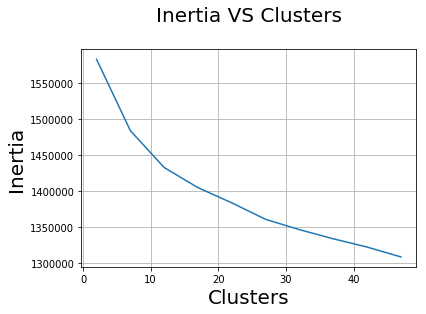

In [49]:
# Elbow Knee Method
plt.plot(clusters, inertia)
plt.xlabel('Clusters',size=20)
plt.ylabel('Inertia',size=20)
plt.title('Inertia VS Clusters\n',size=20)
plt.grid()
plt.show()

In [51]:
optimal_cluster = 7

In [52]:
kmeans = KMeans(n_clusters=optimal_cluster, n_jobs=-1).fit(kmeans_bow)

In [153]:
# Storing all reviews according to their cluster
all_rev = data_kmeans['Text'].values
total_number_reviews = kmeans.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []

In [154]:
for i in range(total_number_reviews):
    label = kmeans.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    elif label == 3:
        cluster4.append(all_rev[i])
    elif label == 4:
        cluster5.append(all_rev[i])
    elif label == 5:
        cluster6.append(all_rev[i])
    else :
        cluster6.append(all_rev[i]) 

In [155]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))
print("Total no. of reviews in Cluster 5 : ",len(cluster5))
print("Total no. of reviews in Cluster 6 : ",len(cluster6))
print("Total no. of reviews in Cluster 7 : ",len(cluster7))

Total no. of reviews in Cluster 1 :  452
Total no. of reviews in Cluster 2 :  3342
Total no. of reviews in Cluster 3 :  1887
Total no. of reviews in Cluster 4 :  16
Total no. of reviews in Cluster 5 :  254
Total no. of reviews in Cluster 6 :  23090
Total no. of reviews in Cluster 7 :  959


### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

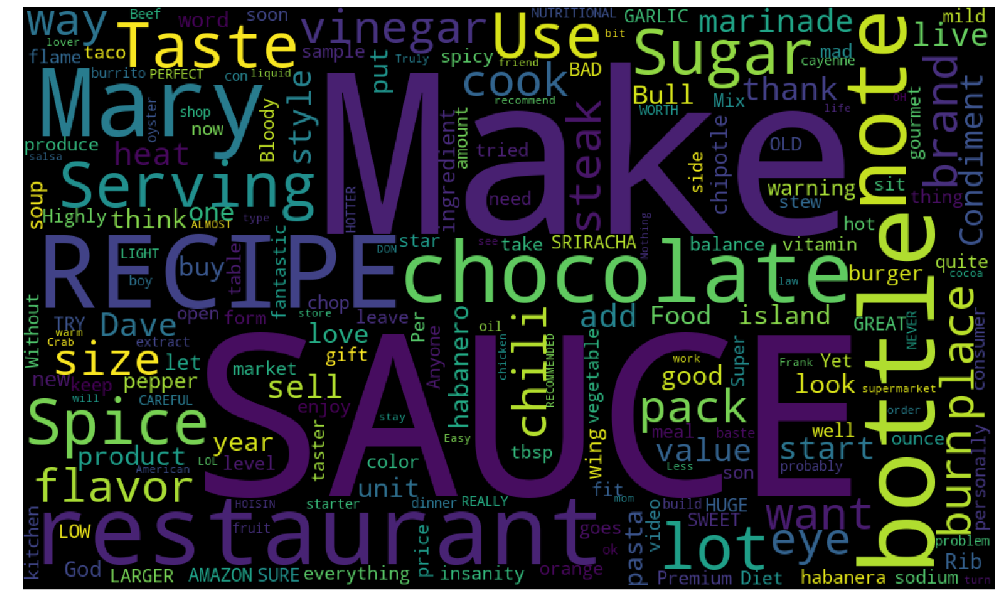

In [146]:
showWordCloud(cluster1)

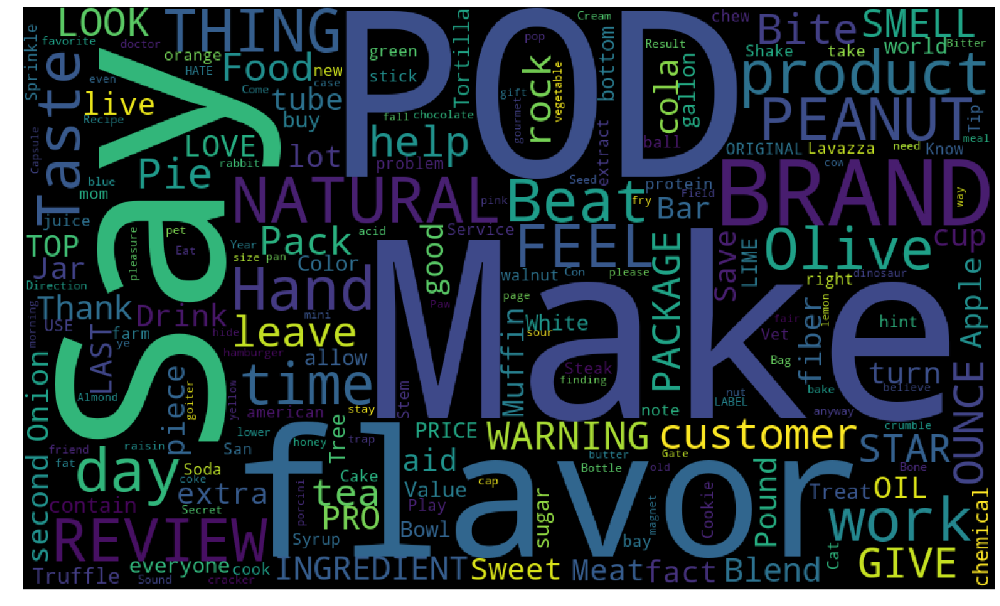

In [147]:
showWordCloud(cluster2)

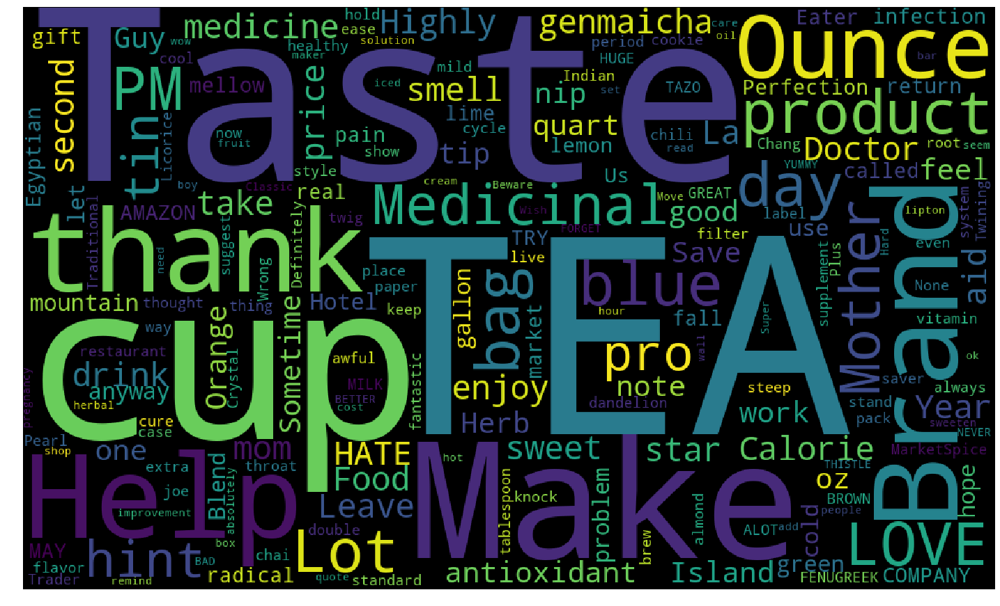

In [148]:
showWordCloud(cluster3)

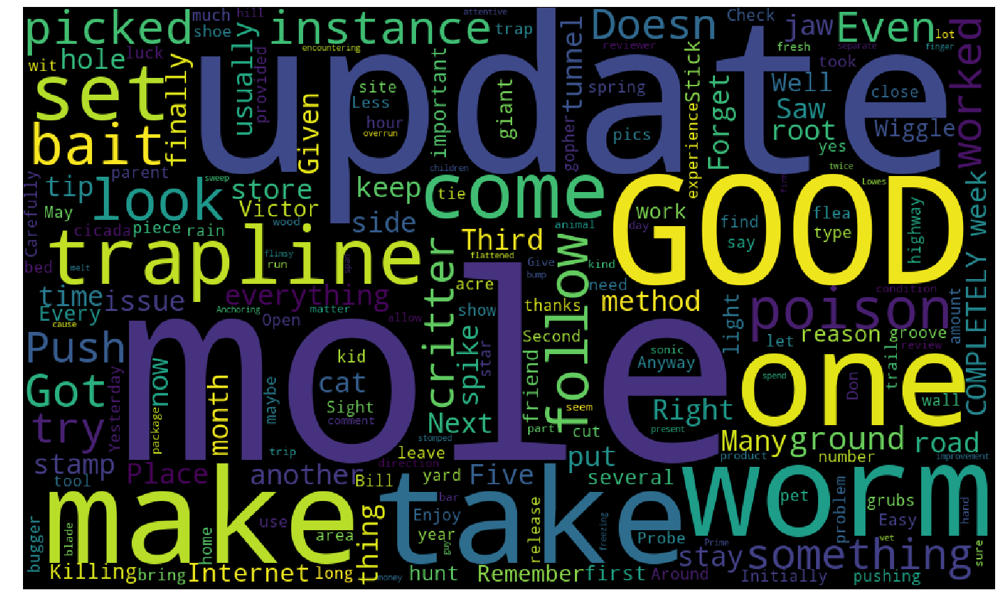

In [149]:
showWordCloud(cluster4)

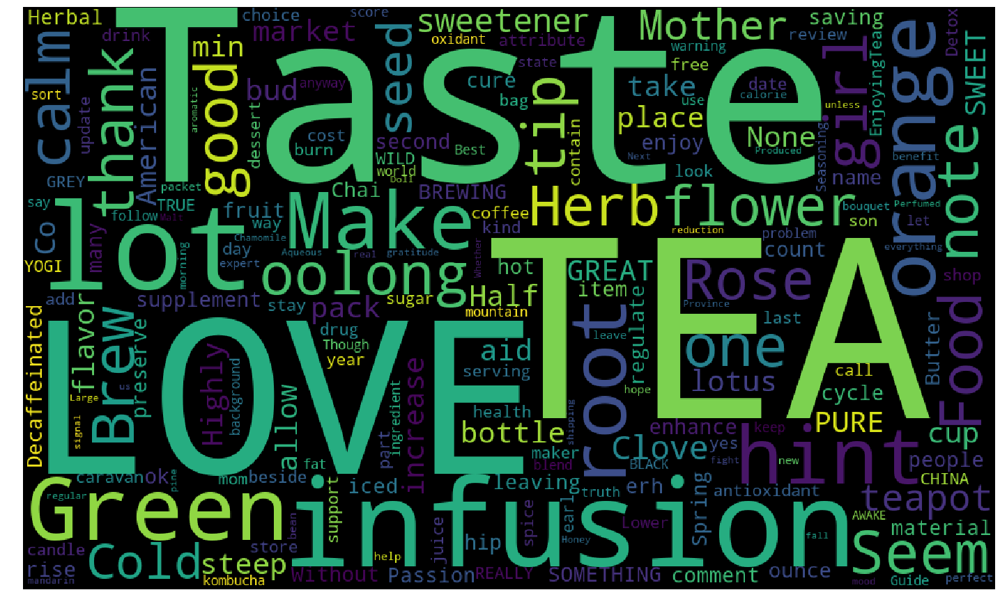

In [150]:
showWordCloud(cluster5)

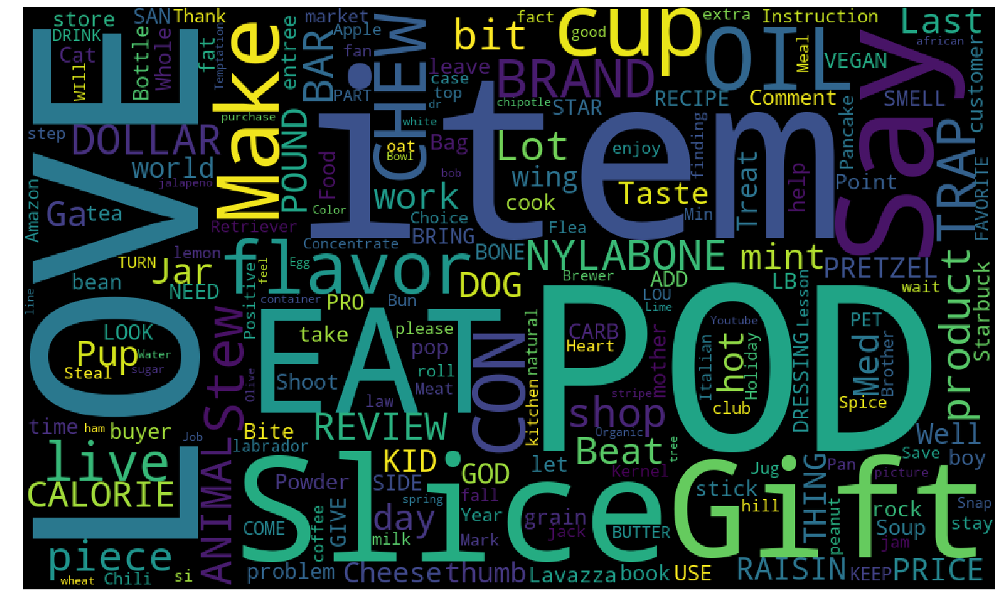

In [151]:
showWordCloud(cluster6)

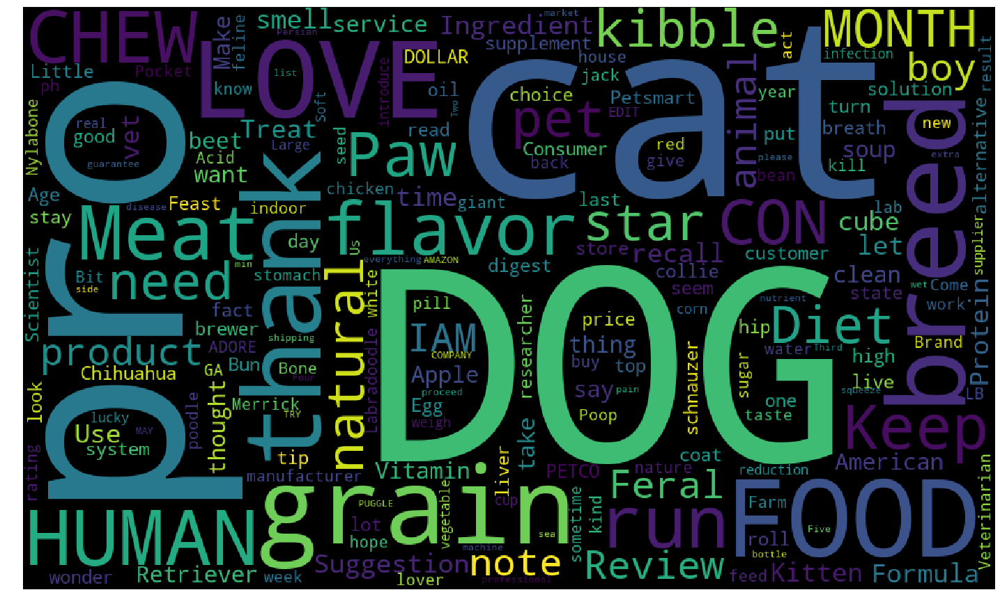

In [152]:
showWordCloud(cluster7)

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [180]:
clusters = list(range(2, 50,5))
inertia = []
for i in tqdm(clusters):
    kmeans = KMeans(n_clusters=i, n_init=5, n_jobs=-1).fit(kmeans_tfidf)
    inertia.append(kmeans.inertia_)

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [43:20<00:00, 272.87s/it]


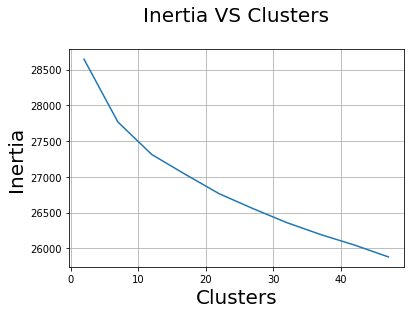

In [181]:
# Elbow Knee Method
plt.plot(clusters, inertia)
plt.xlabel('Clusters',size=20)
plt.ylabel('Inertia',size=20)
plt.title('Inertia VS Clusters\n',size=20)
plt.grid()
plt.show()

In [182]:
optimal_cluster = 6

In [183]:
kmeans = KMeans(n_clusters=optimal_cluster, n_jobs=-1).fit(kmeans_bow)

In [188]:
# Storing all reviews according to their cluster
all_rev = data_kmeans['Text'].values
total_number_reviews = kmeans.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []

In [189]:
for i in range(total_number_reviews):
    label = kmeans.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    elif label == 3:
        cluster4.append(all_rev[i])
    elif label == 4:
        cluster5.append(all_rev[i])
    else :
        cluster6.append(all_rev[i]) 

In [190]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))
print("Total no. of reviews in Cluster 5 : ",len(cluster5))
print("Total no. of reviews in Cluster 6 : ",len(cluster6))

Total no. of reviews in Cluster 1 :  1731
Total no. of reviews in Cluster 2 :  914
Total no. of reviews in Cluster 3 :  453
Total no. of reviews in Cluster 4 :  3123
Total no. of reviews in Cluster 5 :  564
Total no. of reviews in Cluster 6 :  23215


### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

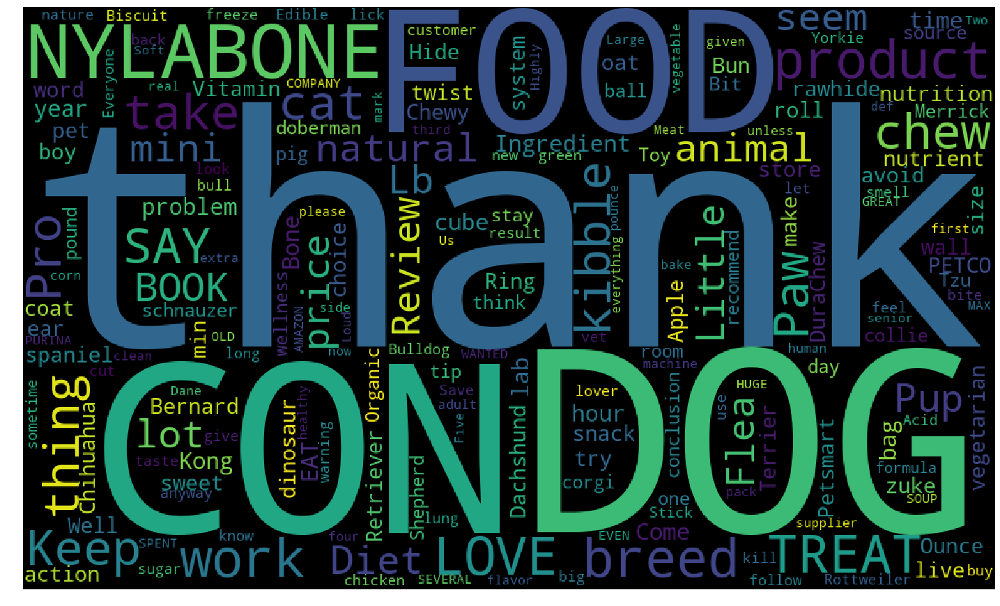

In [191]:
showWordCloud(cluster1)

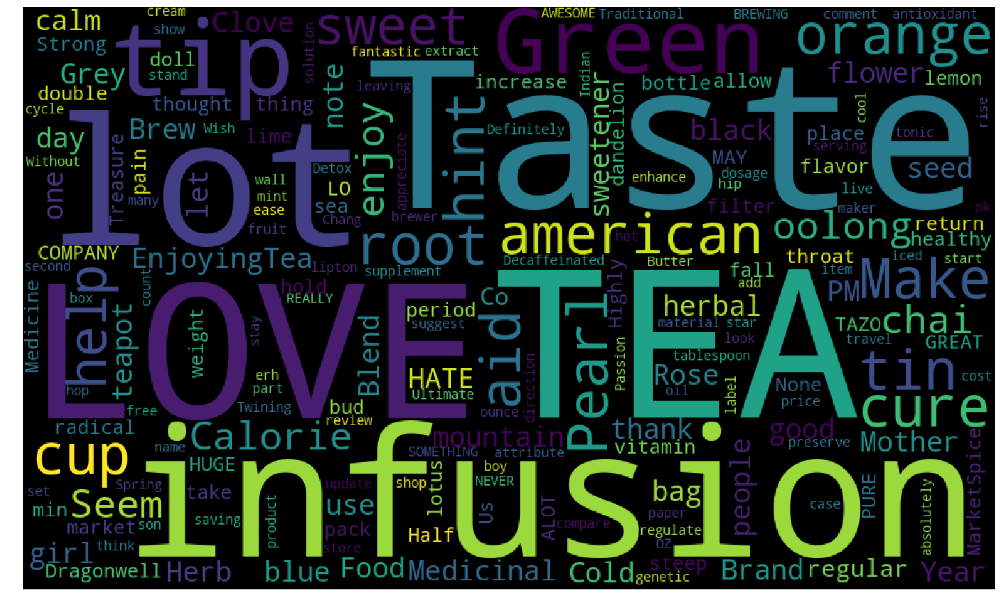

In [192]:
showWordCloud(cluster2)

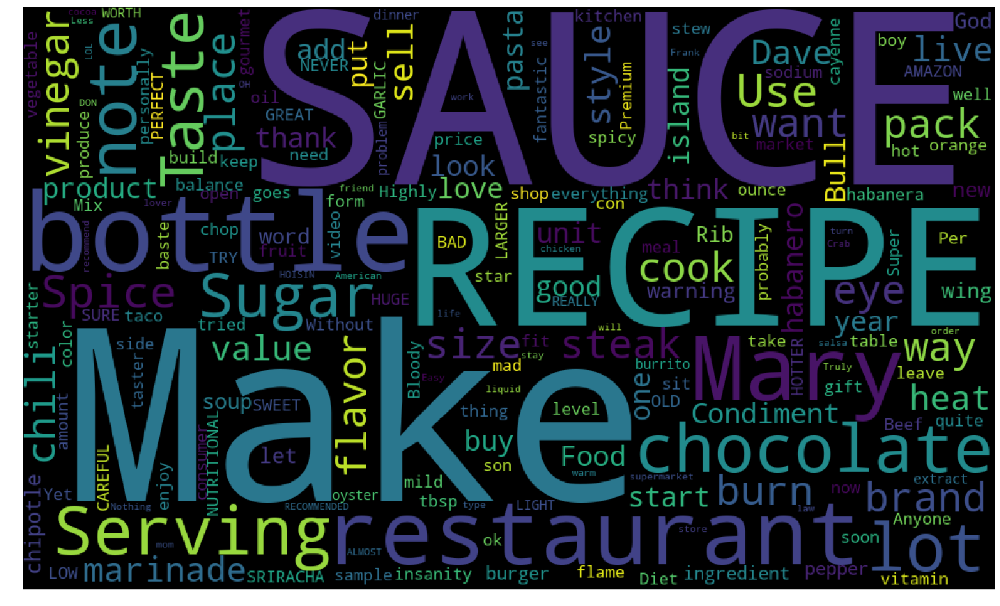

In [193]:
showWordCloud(cluster3)

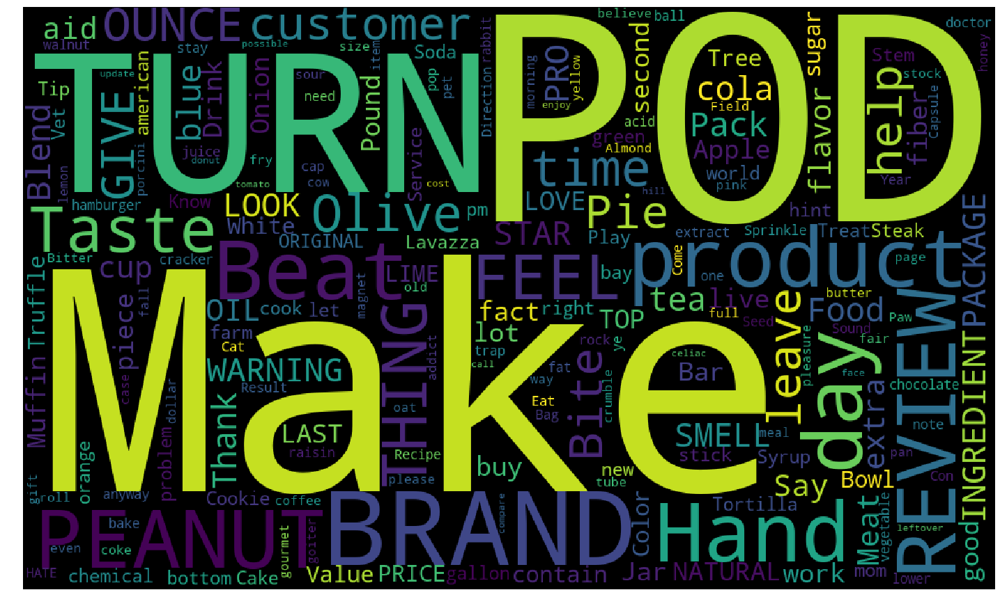

In [194]:
showWordCloud(cluster4)

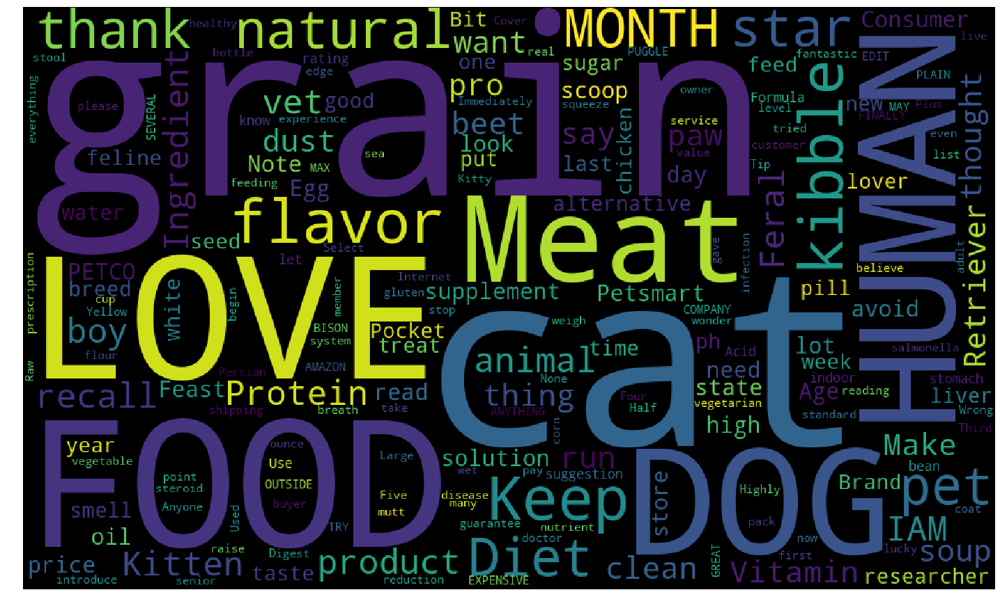

In [195]:
showWordCloud(cluster5)

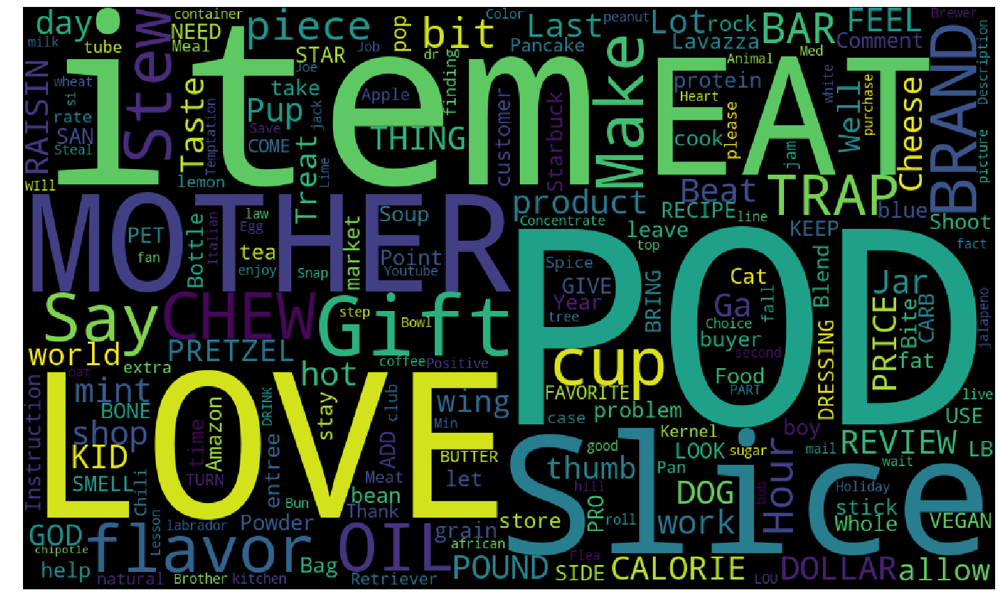

In [196]:
showWordCloud(cluster6)

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [197]:
clusters = list(range(2, 50,5))
inertia = []
for i in tqdm(clusters):
    kmeans = KMeans(n_clusters=i, n_init=5, n_jobs=-1).fit(kmeans_w2vec_data)
    inertia.append(kmeans.inertia_)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:21<00:00, 19.57s/it]


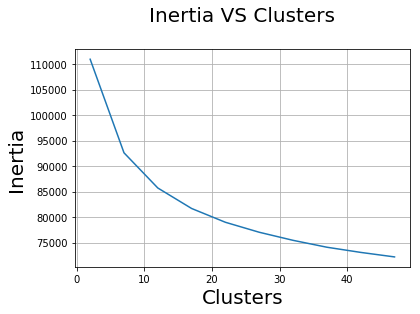

In [198]:
# Elbow Knee Method
plt.plot(clusters, inertia)
plt.xlabel('Clusters',size=20)
plt.ylabel('Inertia',size=20)
plt.title('Inertia VS Clusters\n',size=20)
plt.grid()
plt.show()

In [201]:
optimal_cluster = 7

In [202]:
kmeans = KMeans(n_clusters=optimal_cluster, n_jobs=-1).fit(kmeans_w2vec_data)

In [203]:
# Storing all reviews according to their cluster
all_rev = data_kmeans['Text'].values
total_number_reviews = kmeans.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []

In [204]:
for i in range(total_number_reviews):
    label = kmeans.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    elif label == 3:
        cluster4.append(all_rev[i])
    elif label == 4:
        cluster5.append(all_rev[i])
    elif label == 5:
        cluster6.append(all_rev[i])
    else :
        cluster7.append(all_rev[i]) 

In [214]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))
print("Total no. of reviews in Cluster 5 : ",len(cluster5))
print("Total no. of reviews in Cluster 6 : ",len(cluster6))
print("Total no. of reviews in Cluster 7 : ",len(cluster7))

Total no. of reviews in Cluster 1 :  4910
Total no. of reviews in Cluster 2 :  4544
Total no. of reviews in Cluster 3 :  2851
Total no. of reviews in Cluster 4 :  6333
Total no. of reviews in Cluster 5 :  3066
Total no. of reviews in Cluster 6 :  3940
Total no. of reviews in Cluster 7 :  4356


### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

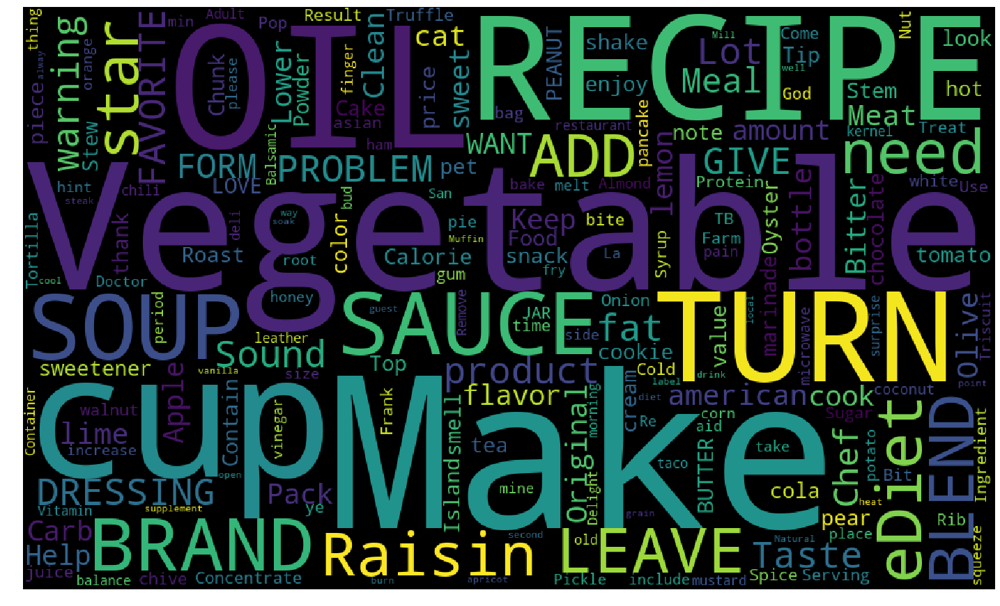

In [215]:
showWordCloud(cluster1)

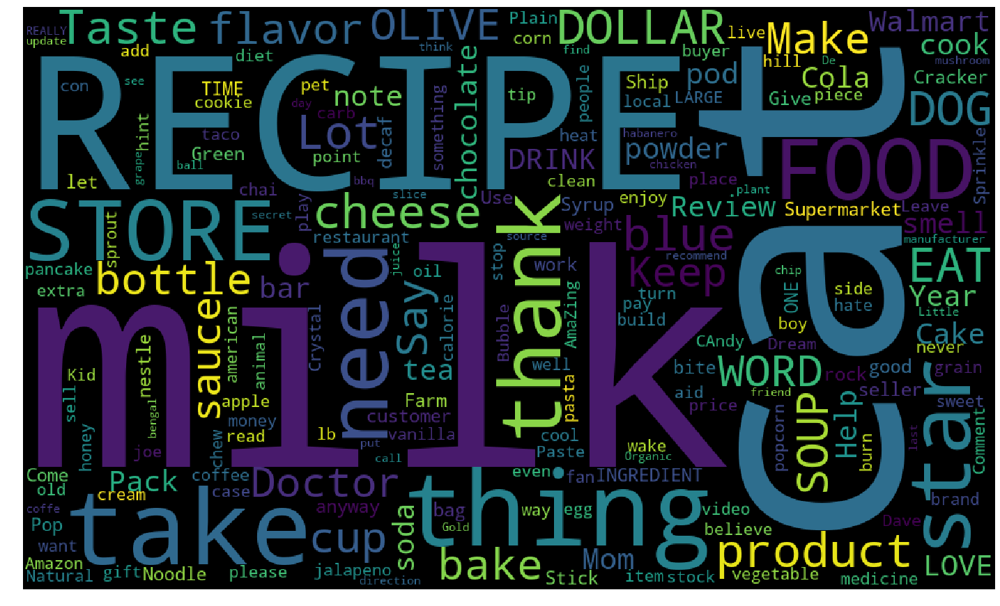

In [216]:
showWordCloud(cluster2)

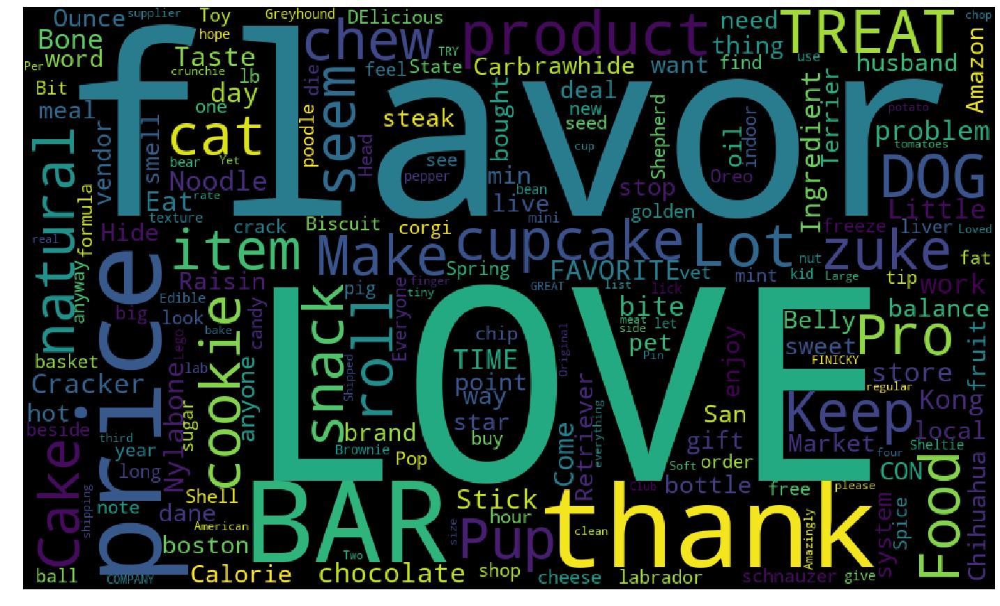

In [217]:
showWordCloud(cluster3)

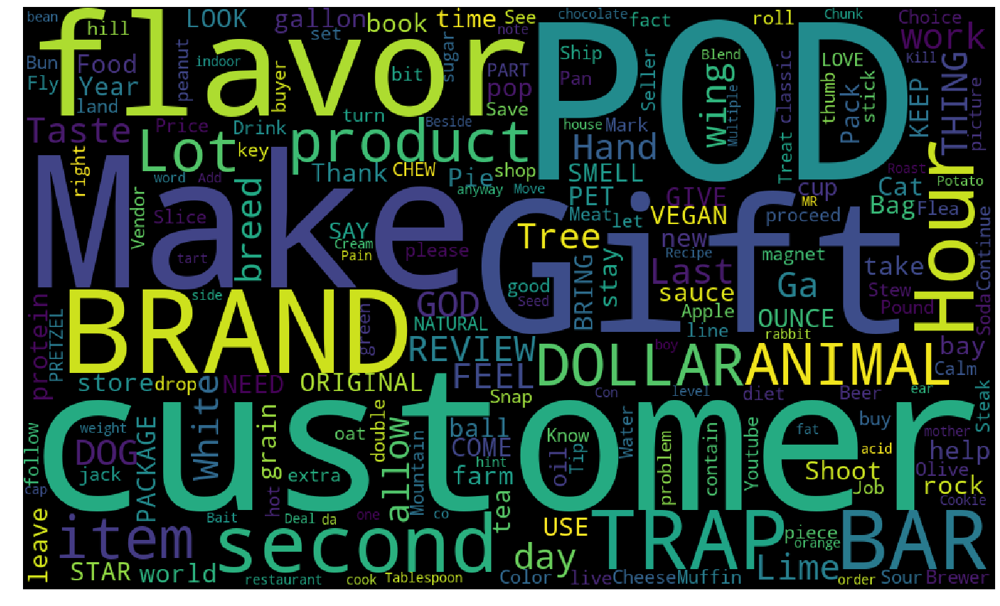

In [218]:
showWordCloud(cluster4)

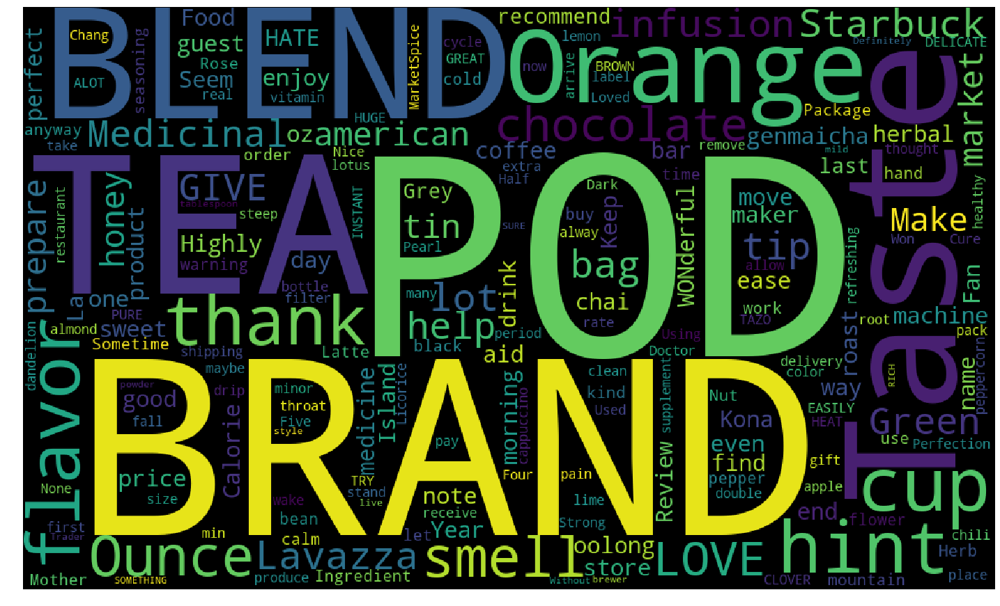

In [219]:
showWordCloud(cluster5)

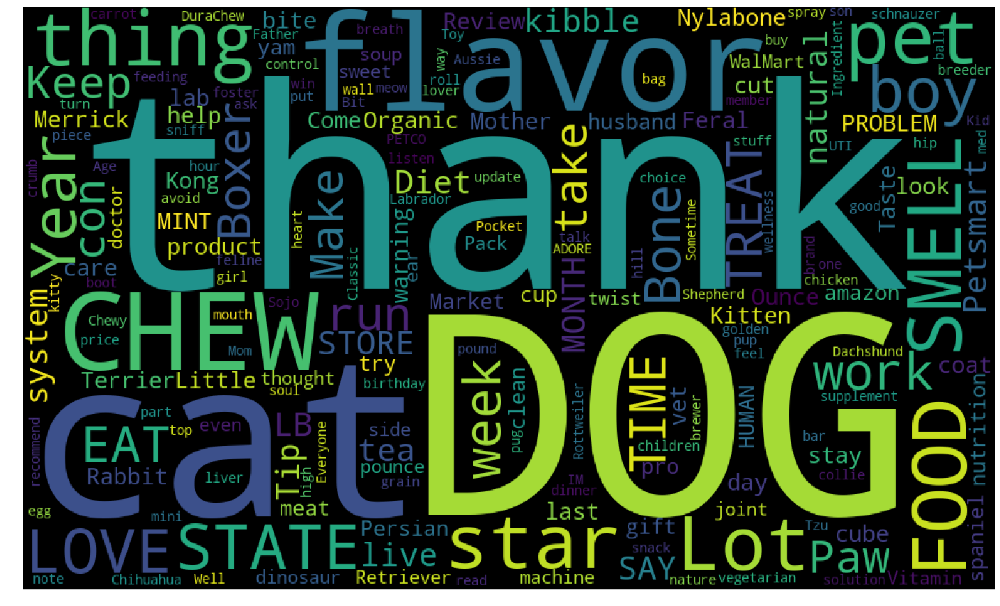

In [220]:
showWordCloud(cluster6)

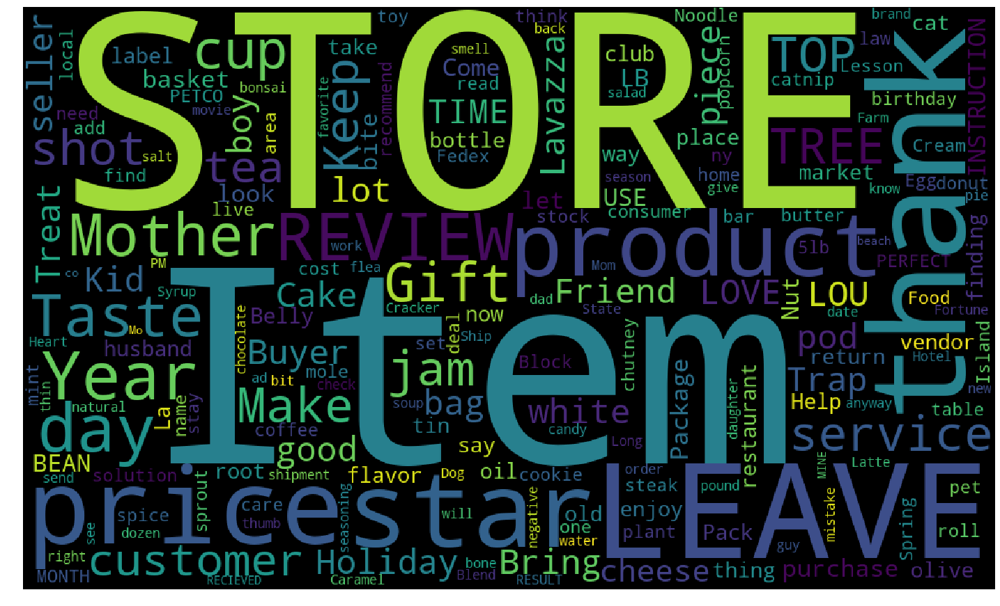

In [221]:
showWordCloud(cluster7)

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [222]:
clusters = list(range(2, 50,5))
inertia = []
for i in tqdm(clusters):
    kmeans = KMeans(n_clusters=i, n_init=5, n_jobs=-1).fit(tfidf_data_kmeans)
    inertia.append(kmeans.inertia_)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:15<00:00, 19.39s/it]


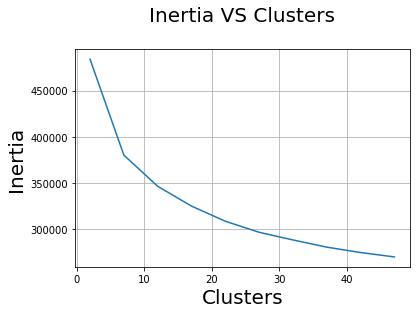

In [223]:
# Elbow Knee Method
plt.plot(clusters, inertia)
plt.xlabel('Clusters',size=20)
plt.ylabel('Inertia',size=20)
plt.title('Inertia VS Clusters\n',size=20)
plt.grid()
plt.show()

In [232]:
optimal_cluster = 7

In [233]:
kmeans = KMeans(n_clusters=optimal_cluster, n_jobs=-1).fit(tfidf_data_kmeans)

In [234]:
# Storing all reviews according to their cluster
all_rev = data_kmeans['Text'].values
total_number_reviews = kmeans.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []

In [235]:
for i in range(total_number_reviews):
    label = kmeans.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    elif label == 3:
        cluster4.append(all_rev[i])
    elif label == 4:
        cluster5.append(all_rev[i])
    elif label == 5:
        cluster6.append(all_rev[i])
    else :
        cluster7.append(all_rev[i]) 

In [236]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))
print("Total no. of reviews in Cluster 5 : ",len(cluster5))
print("Total no. of reviews in Cluster 6 : ",len(cluster6))
print("Total no. of reviews in Cluster 7 : ",len(cluster7))

Total no. of reviews in Cluster 1 :  3107
Total no. of reviews in Cluster 2 :  6433
Total no. of reviews in Cluster 3 :  3025
Total no. of reviews in Cluster 4 :  6627
Total no. of reviews in Cluster 5 :  6717
Total no. of reviews in Cluster 6 :  1659
Total no. of reviews in Cluster 7 :  2432


### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

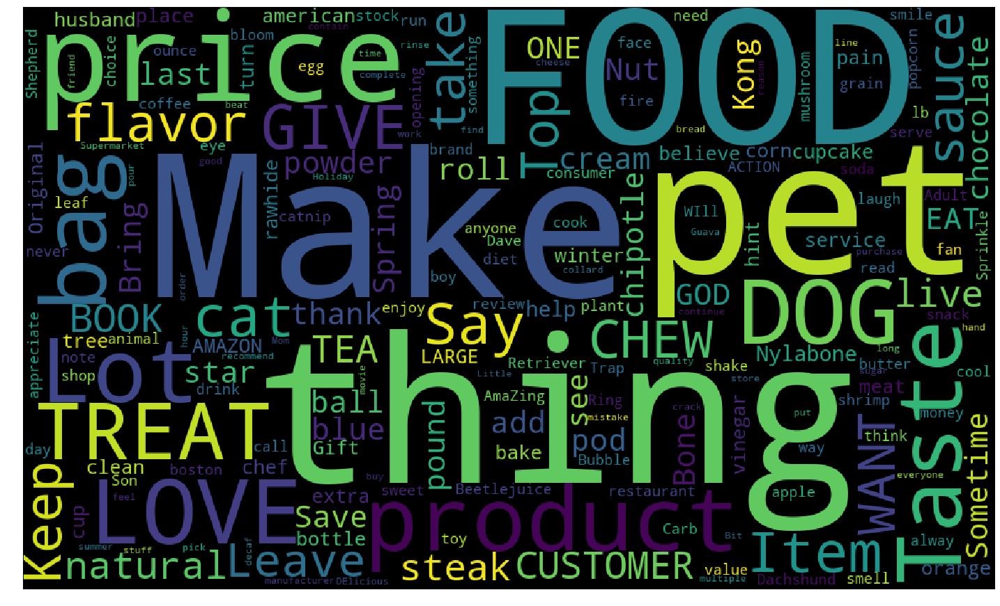

In [237]:
showWordCloud(cluster1)

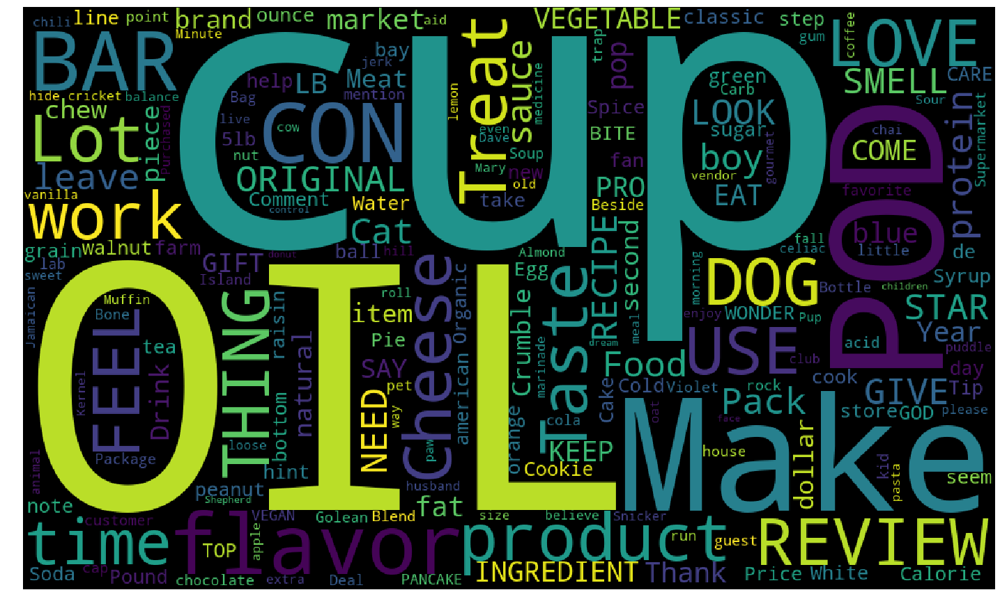

In [238]:
showWordCloud(cluster2)

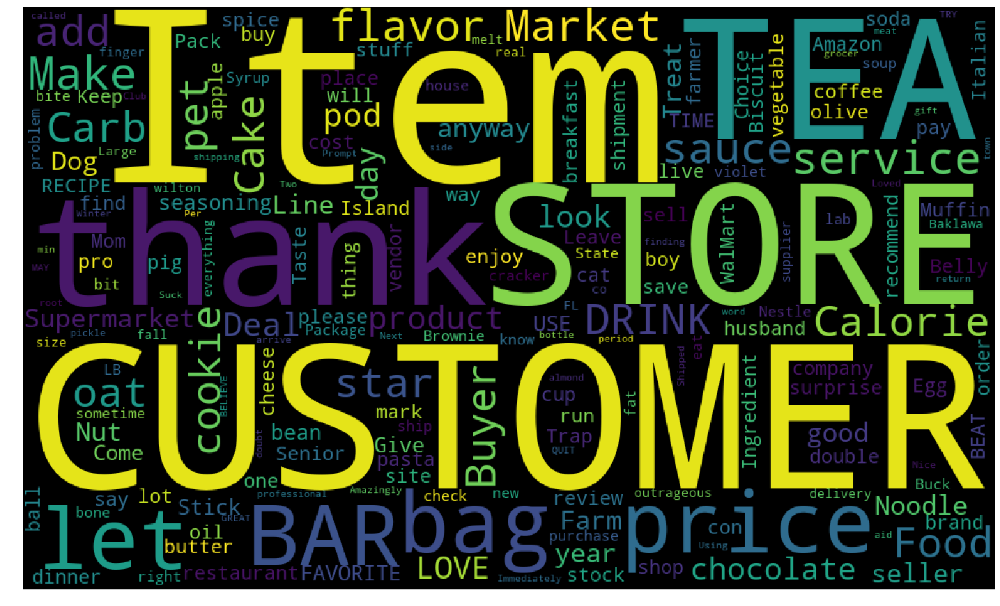

In [239]:
showWordCloud(cluster3)

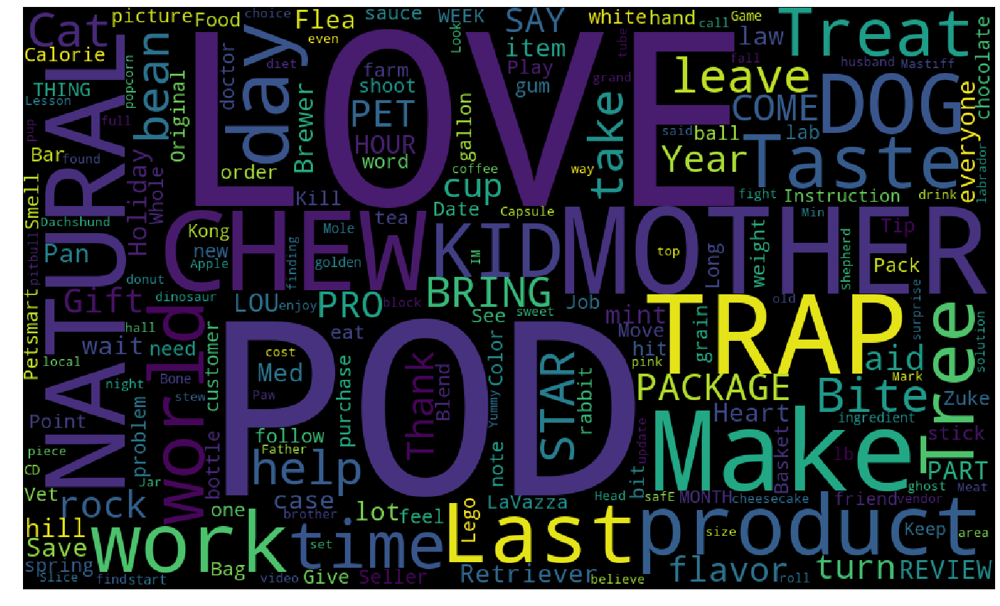

In [240]:
showWordCloud(cluster4)

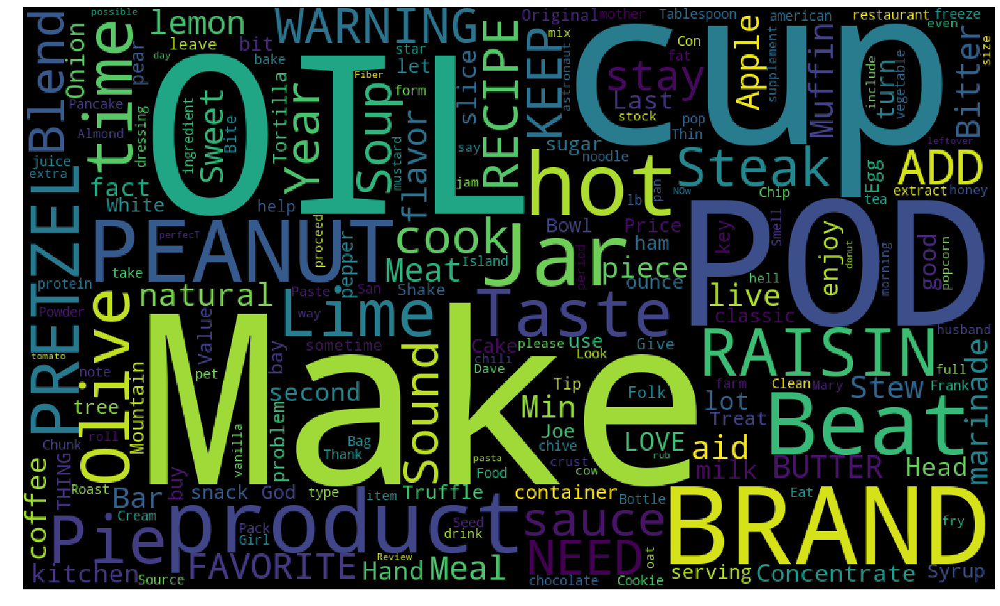

In [241]:
showWordCloud(cluster5)

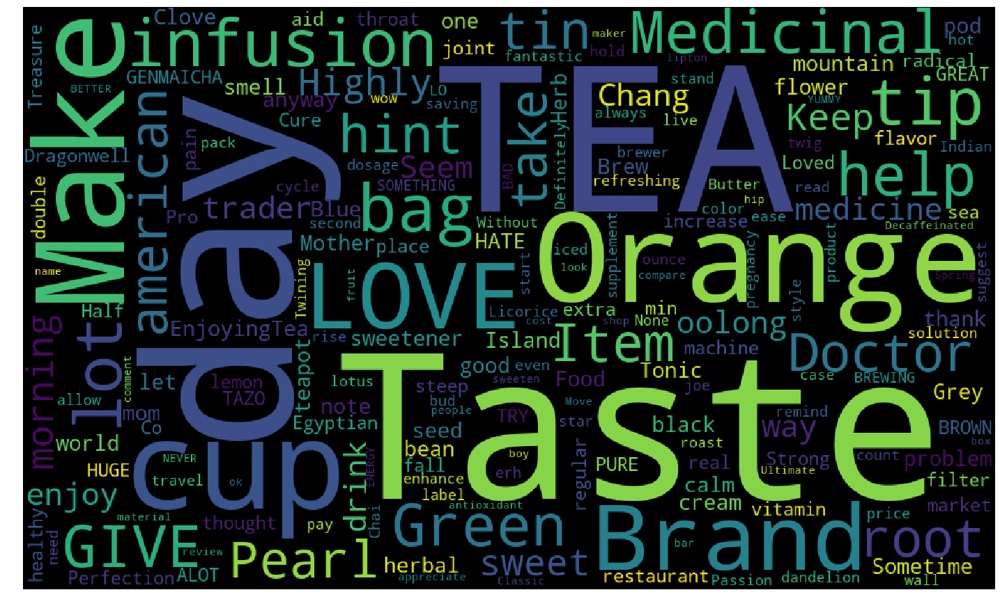

In [242]:
showWordCloud(cluster6)

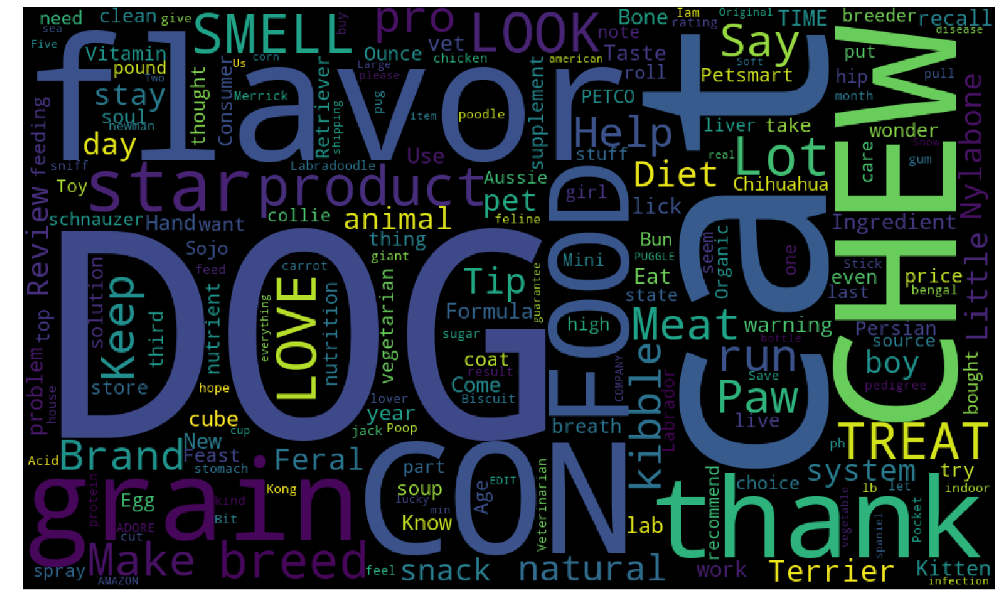

In [243]:
showWordCloud(cluster7)

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [136]:
# Lets try with different no of cluster like 2,4 and then finding the best one

### Clusters = 2

In [329]:
agg_clust = AgglomerativeClustering(n_clusters = 2).fit(w2vec_data)

In [330]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = agg_clust.labels_.shape[0]
cluster1 = []
cluster2 = []

In [331]:
for i in range(total_number_reviews):
    label = agg_clust.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    else :
        cluster2.append(all_rev[i]) 

In [332]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))

Total no. of reviews in Cluster 1 :  3072
Total no. of reviews in Cluster 2 :  928


### Clusters = 4

In [341]:
agg_clust = AgglomerativeClustering(n_clusters = 4).fit(w2vec_data)

In [342]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = agg_clust.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []

In [343]:
for i in range(total_number_reviews):
    label = agg_clust.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    else :
        cluster4.append(all_rev[i]) 

In [344]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))

Total no. of reviews in Cluster 1 :  1478
Total no. of reviews in Cluster 2 :  928
Total no. of reviews in Cluster 3 :  1019
Total no. of reviews in Cluster 4 :  575


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

### Clusters = 2

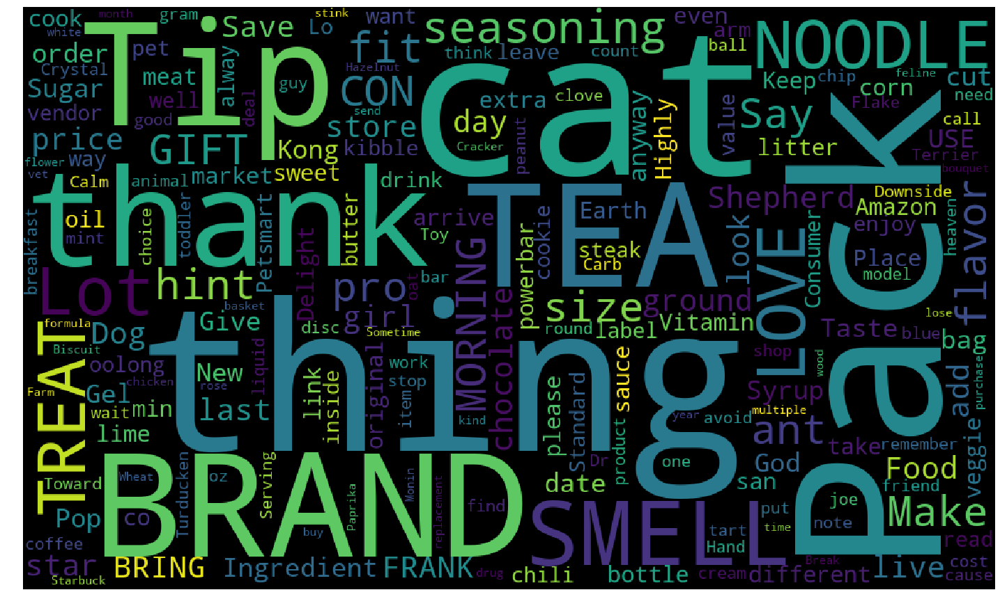

In [333]:
showWordCloud(cluster1)

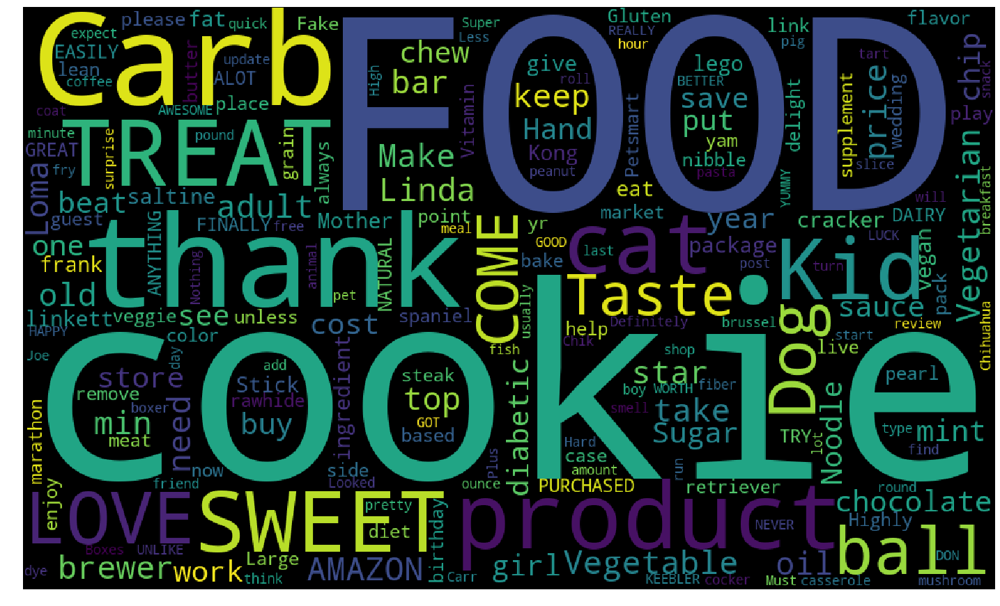

In [334]:
showWordCloud(cluster2)

### for clusters = 4

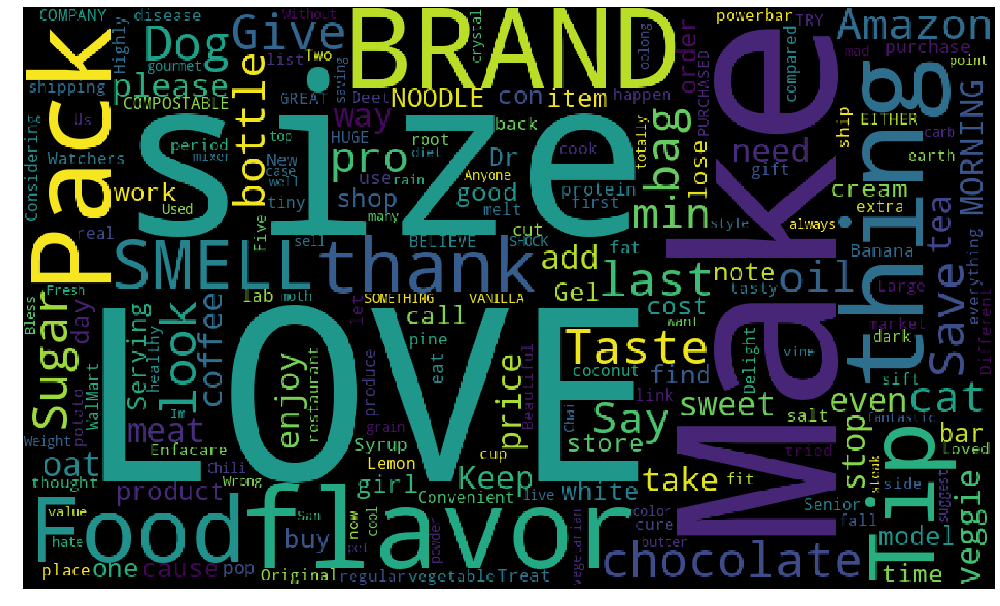

In [345]:
showWordCloud(cluster1)

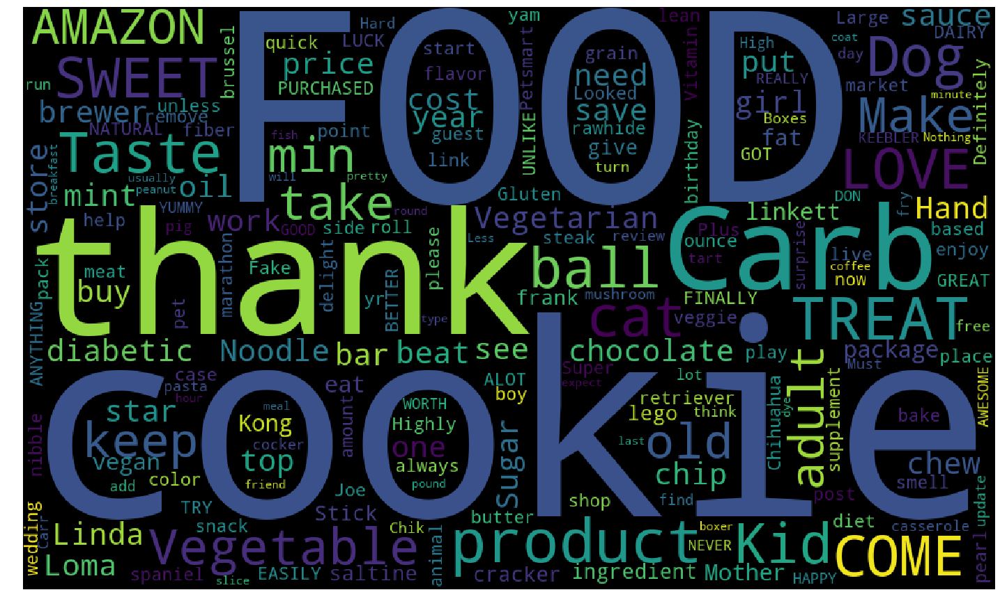

In [346]:
showWordCloud(cluster2)

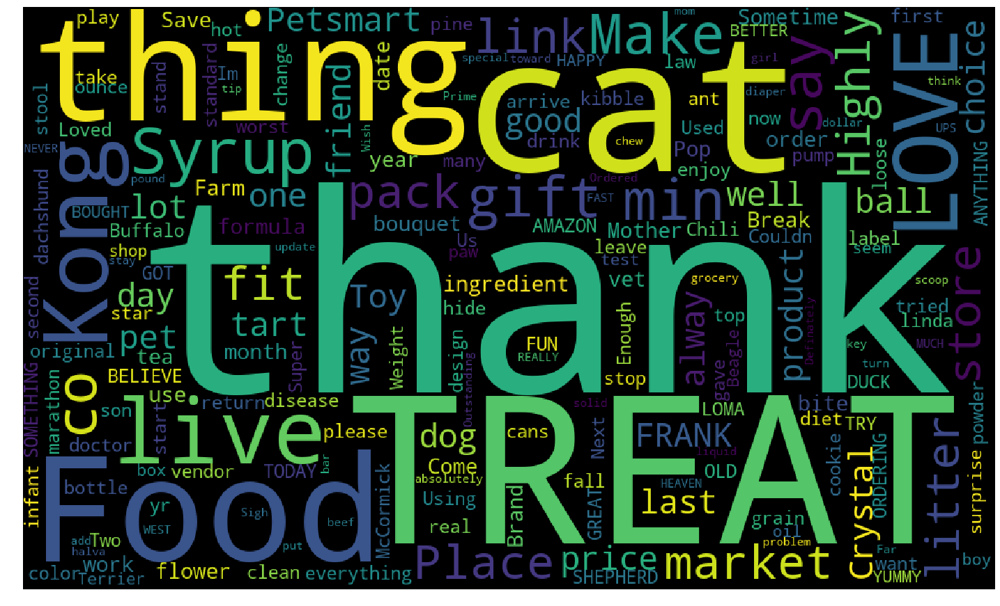

In [347]:
showWordCloud(cluster3)

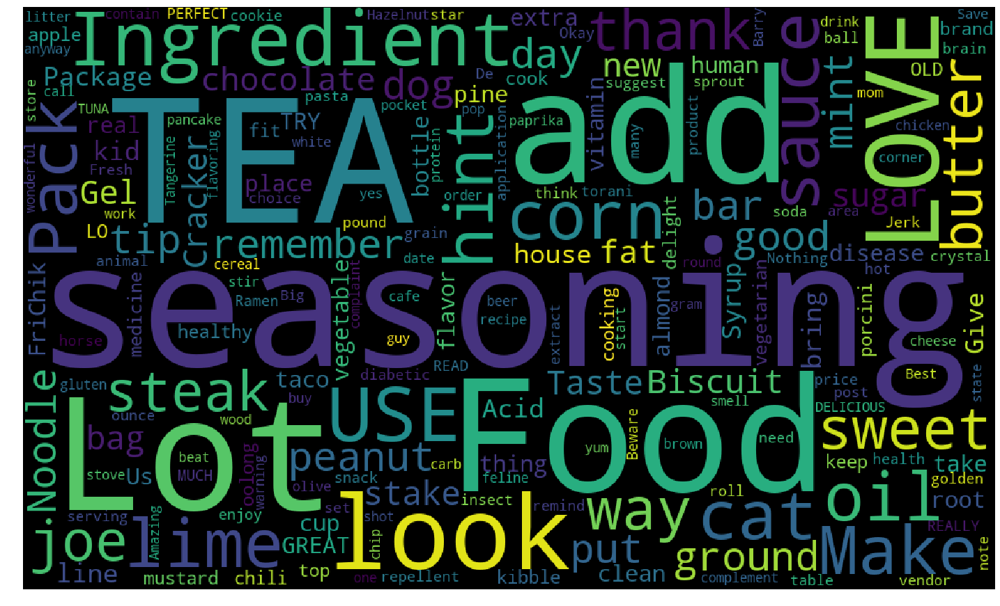

In [348]:
showWordCloud(cluster4)

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

### Clusters = 2

In [353]:
agg_clust = AgglomerativeClustering(n_clusters = 2).fit(tfidf_data)

In [354]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = agg_clust.labels_.shape[0]
cluster1 = []
cluster2 = []

In [355]:
for i in range(total_number_reviews):
    label = agg_clust.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    else :
        cluster2.append(all_rev[i]) 

In [356]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))

Total no. of reviews in Cluster 1 :  2627
Total no. of reviews in Cluster 2 :  1373


In [359]:
### Clusters = 4

In [360]:
agg_clust = AgglomerativeClustering(n_clusters = 4).fit(tfidf_data)

In [361]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = agg_clust.labels_.shape[0]
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []

In [362]:
for i in range(total_number_reviews):
    label = agg_clust.labels_[i]
    if label == 0:
        cluster1.append(all_rev[i])
    elif label == 1:
        cluster2.append(all_rev[i])
    elif label == 2:
        cluster3.append(all_rev[i])
    else :
        cluster4.append(all_rev[i]) 

In [363]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews in Cluster 2 : ",len(cluster2))
print("Total no. of reviews in Cluster 3 : ",len(cluster3))
print("Total no. of reviews in Cluster 4 : ",len(cluster4))

Total no. of reviews in Cluster 1 :  1363
Total no. of reviews in Cluster 2 :  1187
Total no. of reviews in Cluster 3 :  1264
Total no. of reviews in Cluster 4 :  186


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

### Clusters = 2

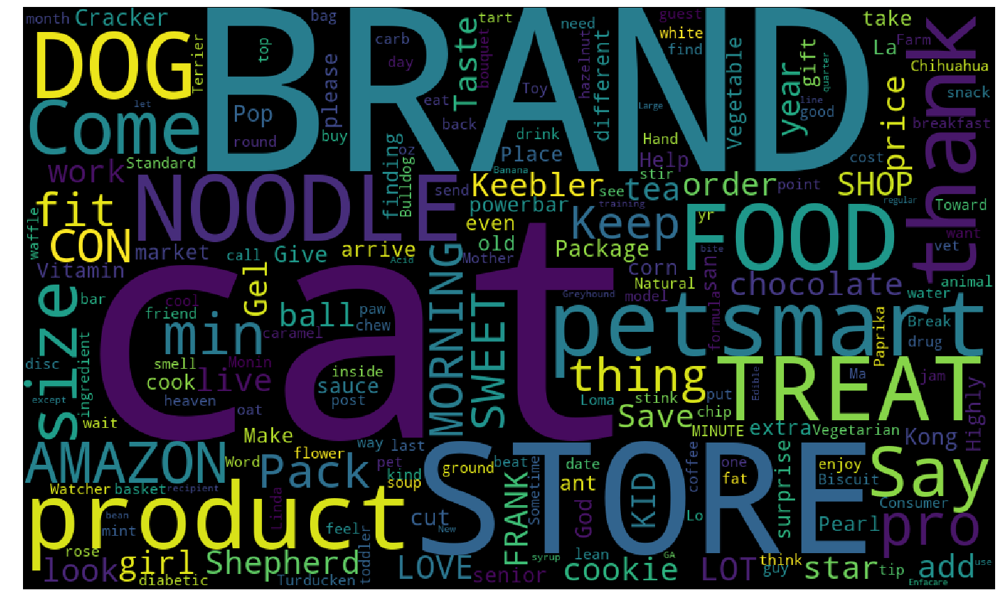

In [357]:
showWordCloud(cluster1)

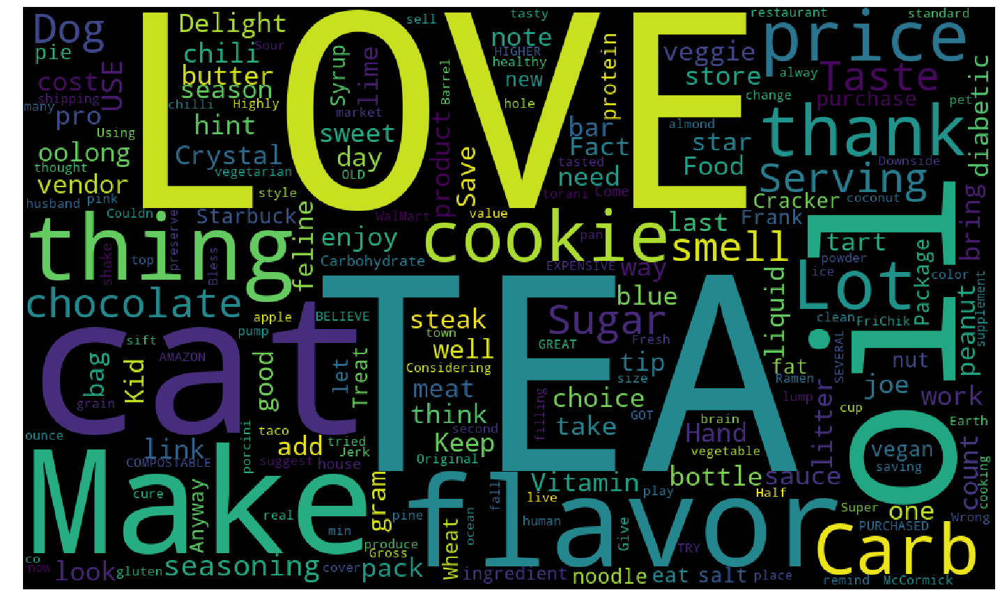

In [358]:
showWordCloud(cluster2)

### for clusters = 4

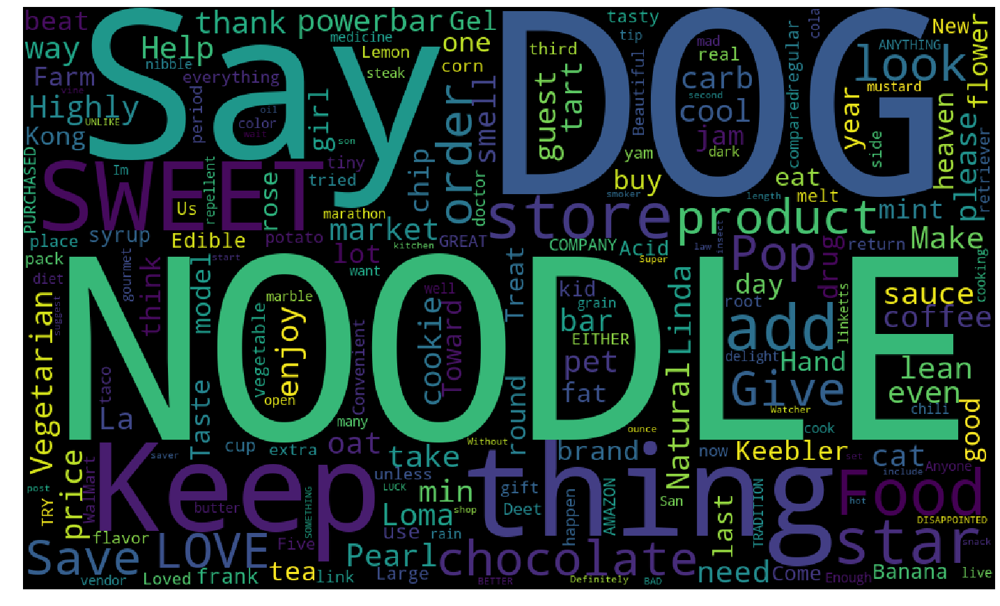

In [364]:
showWordCloud(cluster1)

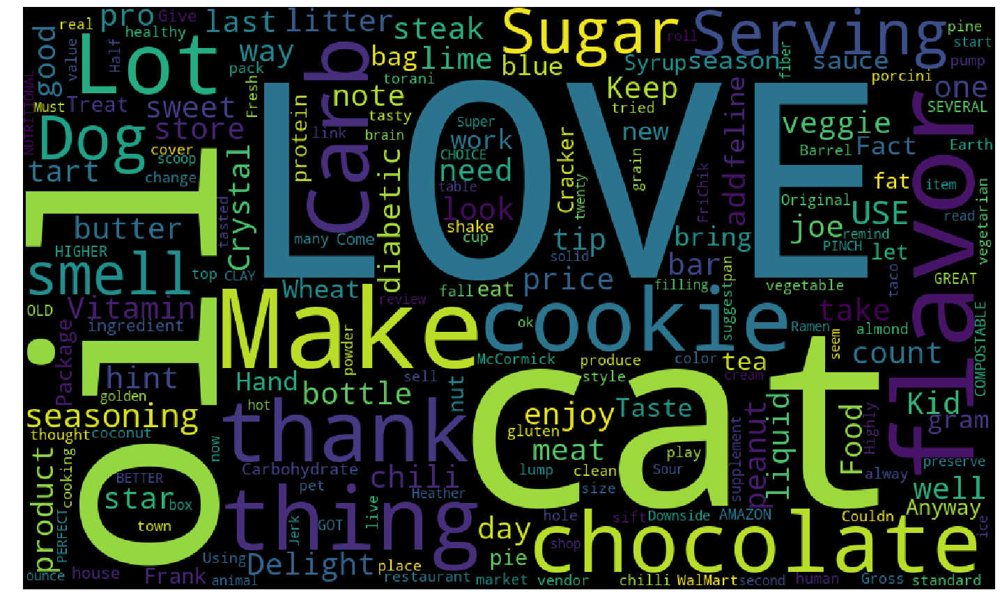

In [365]:
showWordCloud(cluster2)

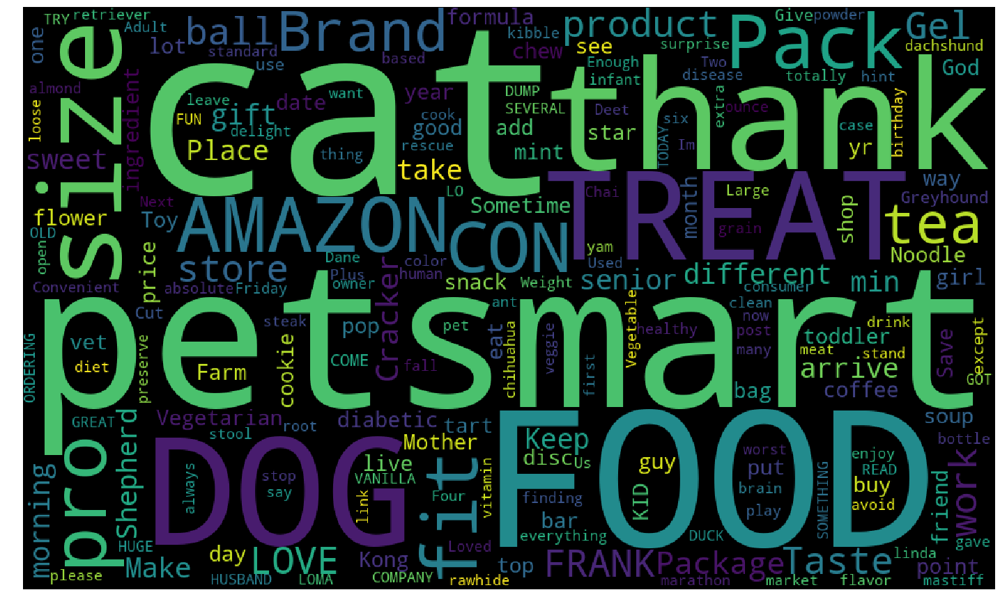

In [366]:
showWordCloud(cluster3)

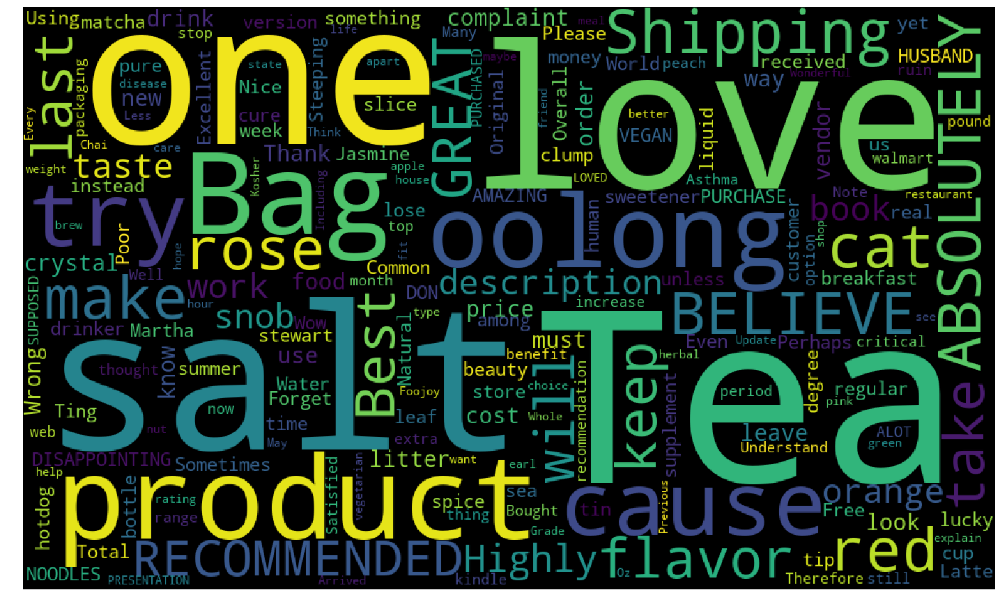

In [367]:
showWordCloud(cluster4)

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [89]:
sc = StandardScaler()
data_w2vec = sc.fit_transform(w2vec_data)

In [90]:
# Calculating distances of point of nearest neighbour
min_pts = 2*data.shape[1]
nearest_distance = n_neigh_distance(min_pts,data_w2vec)
# Sorting the distance so that it will help to find the best eps in the plot by giving a curve like plot
distance = np.sort(nearest_distance)

# genereting all possible point in range of the reviews
total_reviews = data_w2vec.shape[0]
data_points = []
for i in range(total_reviews):
    data_points.append(i)

In [91]:
### Appling elbow knee method for finding the best EPS Value

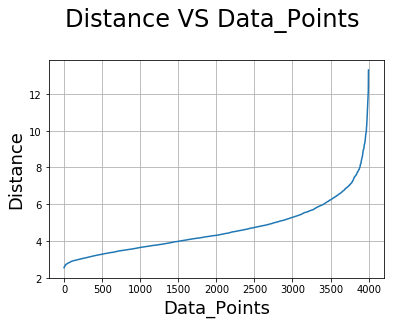

In [92]:
# Draw Distance VS Data_Points plot
plt.plot(data_points, distance)
plt.xlabel('Data_Points',size=18)
plt.ylabel('Distance',size=18)
plt.title('Distance VS Data_Points \n',size=24)
plt.grid()
plt.show()

In [93]:
optimal_eps = 8

In [95]:
dbscan_w2vec = DBSCAN(optimal_eps, min_samples=min_pts, n_jobs=-1).fit(data_w2vec)

In [96]:
# findind the clusters i the model
cluster = set(dbscan_w2vec.labels_)
cluster

{-1, 0}

In [97]:
## so one cluster i.e 0. {-1 is the noisy cluster}
n_clusters = 1

In [99]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = dbscan_w2vec.labels_.shape[0]
cluster1 = []
noise = []

In [101]:
for i in range(total_number_reviews):
    label = dbscan_w2vec.labels_[i]
    if label == -1:
        noise.append(all_rev[i])
    else :
        cluster1.append(all_rev[i]) 

In [103]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews as Noise : ",len(noise))

Total no. of reviews in Cluster 1 :  3976
Total no. of reviews as Noise :  24


### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

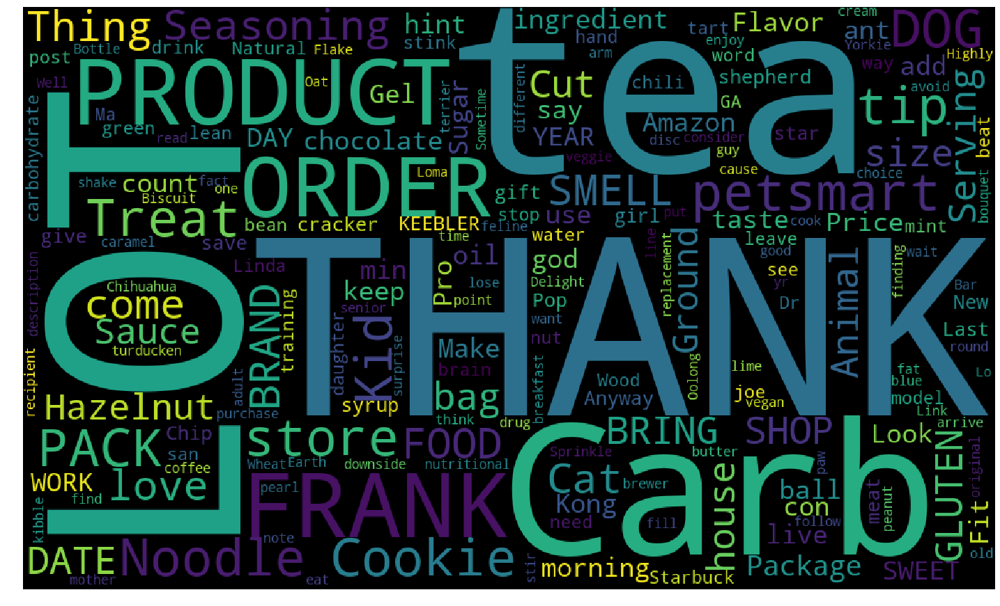

In [109]:
showWordCloud(cluster1)

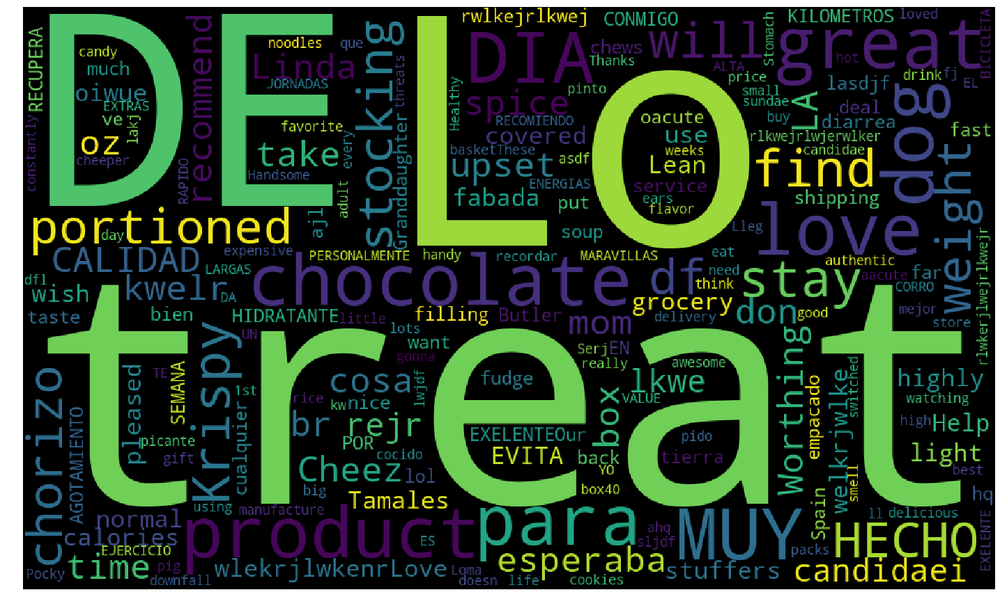

In [110]:
showWordCloud(noise)

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [114]:
sc = StandardScaler()
data_tfidf = sc.fit_transform(tfidf_data)

In [115]:
# Calculating distances of point of nearest neighbour
min_pts = 2*data.shape[1]
nearest_distance = n_neigh_distance(min_pts,data_tfidf)
# Sorting the distance so that it will help to find the best eps in the plot by giving a curve like plot
distance = np.sort(nearest_distance)

# genereting all possible point in range of the reviews
total_reviews = data_tfidf.shape[0]
data_points = []
for i in range(total_reviews):
    data_points.append(i)

In [116]:
### Appling elbow knee method for finding the best EPS Value

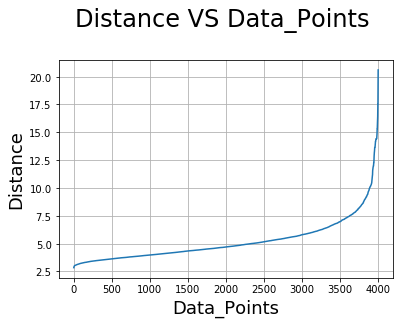

In [117]:
# Draw Distance VS Data_Points plot
plt.plot(data_points, distance)
plt.xlabel('Data_Points',size=18)
plt.ylabel('Distance',size=18)
plt.title('Distance VS Data_Points \n',size=24)
plt.grid()
plt.show()

In [118]:
optimal_eps = 10

In [119]:
dbscan_tfidf_w2vec = DBSCAN(optimal_eps, min_samples=min_pts, n_jobs=-1).fit(data_tfidf)

In [120]:
# findind the clusters i the model
cluster = set(dbscan_tfidf_w2vec.labels_)
cluster

{-1, 0}

In [121]:
## so one cluster i.e 0. {-1 is the noisy cluster}
n_clusters = 1

In [125]:
# Storing all reviews according to their cluster
all_rev = data['Text'].values
total_number_reviews = dbscan_tfidf_w2vec.labels_.shape[0]
cluster1 = []
noise = []

In [126]:
for i in range(total_number_reviews):
    label = dbscan_tfidf_w2vec.labels_[i]
    if label == -1:
        noise.append(all_rev[i])
    else :
        cluster1.append(all_rev[i]) 

In [127]:
print("Total no. of reviews in Cluster 1 : ",len(cluster1))
print("Total no. of reviews as Noise : ",len(noise))

Total no. of reviews in Cluster 1 :  3995
Total no. of reviews as Noise :  5


### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

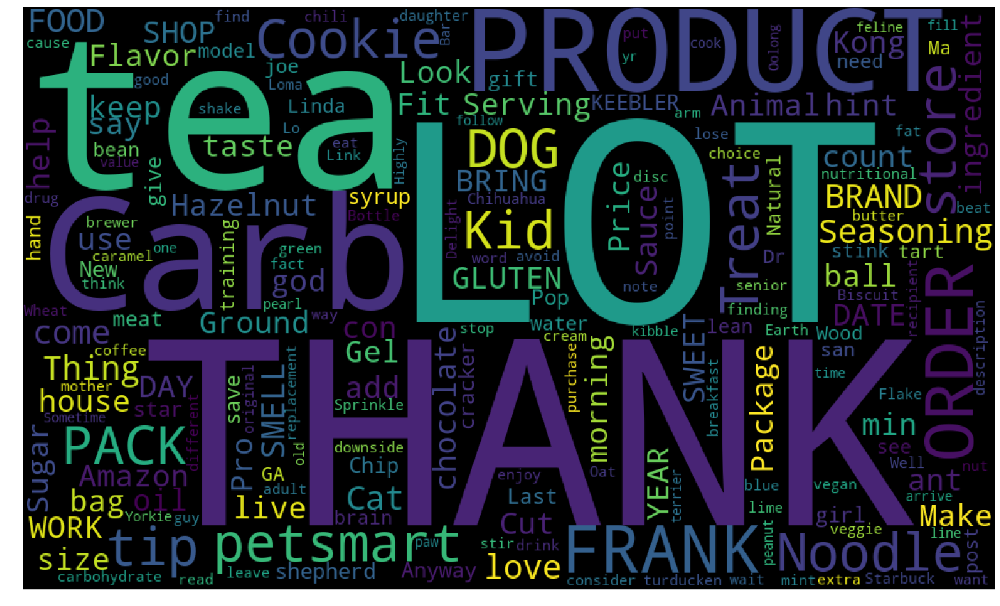

In [128]:
showWordCloud(cluster1)

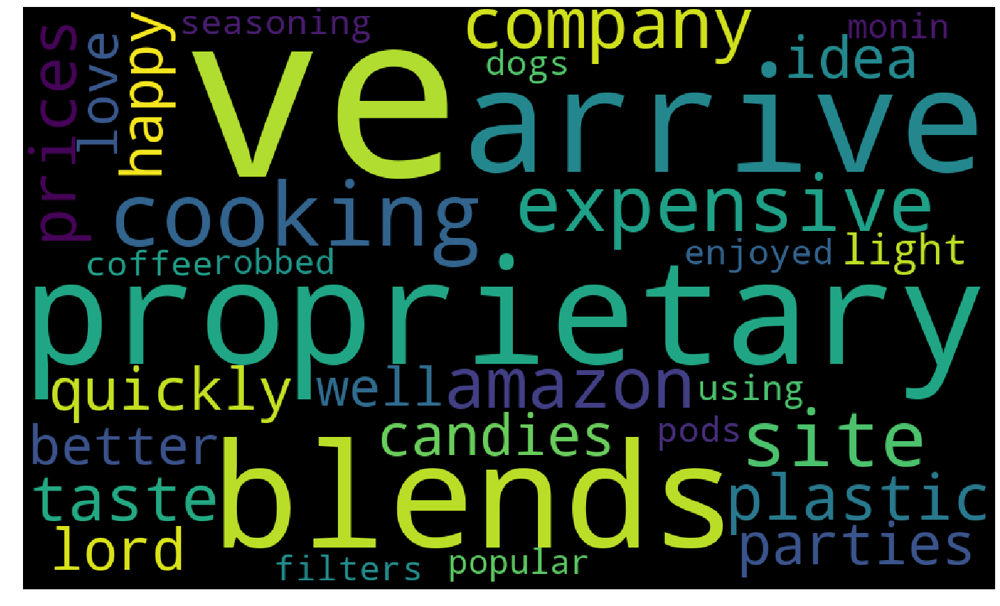

In [129]:
showWordCloud(noise)

# [6] Conclusions

## KMEANS Clustering

In [138]:
#importing library
from prettytable import PrettyTable
x = PrettyTable()

#adding Field names
x.field_names = ["SL No.","Vectorizer","Clustering","Best Cluster"]

# adding row to table
x.add_row(["1","BOW","KMEANS",7])
x.add_row(["2","TF-IDF","KMEANS",6])
x.add_row(["3","AVG-W2VEC","KMEANS",7])
x.add_row(["4","TFIDF-W2VEC","KMEANS",7])

#printing the table
print(x)

+--------+-------------+------------+--------------+
| SL No. |  Vectorizer | Clustering | Best Cluster |
+--------+-------------+------------+--------------+
|   1    |     BOW     |   KMEANS   |      7       |
|   2    |    TF-IDF   |   KMEANS   |      6       |
|   3    |  AVG-W2VEC  |   KMEANS   |      7       |
|   4    | TFIDF-W2VEC |   KMEANS   |      7       |
+--------+-------------+------------+--------------+


## Agglomerative Clustering

In [139]:
#importing library
from prettytable import PrettyTable
x = PrettyTable()

#adding Field names
x.field_names = ["SL No.","Vectorizer","Clustering","Clusters"]

# adding row to table
x.add_row(["1","AVG-W2VEC","Agglometric",2])
x.add_row(["2","TFIDF-W2VEC","Agglometric",2])

#printing the table
print(x)

+--------+-------------+-------------+----------+
| SL No. |  Vectorizer |  Clustering | Clusters |
+--------+-------------+-------------+----------+
|   1    |  AVG-W2VEC  | Agglometric |    2     |
|   2    | TFIDF-W2VEC | Agglometric |    2     |
+--------+-------------+-------------+----------+


## DBSCAN Clustering

In [140]:
#importing library
from prettytable import PrettyTable
x = PrettyTable()

#adding Field names
x.field_names = ["SL No.","Vectorizer","Clustering","Best EPS"]

# adding row to table
x.add_row(["1","AVG-W2VEC","DBSCAN",8])
x.add_row(["2","TFIDF-W2VEC","DBSCAN",10])

#printing the table
print(x)

+--------+-------------+------------+----------+
| SL No. |  Vectorizer | Clustering | Best EPS |
+--------+-------------+------------+----------+
|   1    |  AVG-W2VEC  |   DBSCAN   |    8     |
|   2    | TFIDF-W2VEC |   DBSCAN   |    10    |
+--------+-------------+------------+----------+


## Conclusion points

- > Kmeans clustering optimal clusters in all the vectoizers is remains in the range from 6 to 7 , it divides the whole revies in different groups whihc yield different eatures representing different clusters.

- > Since in agglometric clustering we have tried with different cluster number of that of kmeans, so here from 2,4 clusters 2 is the more satisfying cluster in wordcloud as one of the cluster bears all the food types related stuff and other have the words which is related to the taste and the things names.

- > DBSCAN works well in identifying the noise but in the case of differentiating between the reviews it justs puts whole of the reviews in the same cluster which is not the best result

### --> From the above number of techniques we have studied that we can differentiate between the dataset and can able to divide it on different groups if we donot have their actual labels as in the case of unsupervised learning . Just we need to apply different techniques and find the the best out of them, here agglometric and Kmeans works well